# Try running DGA with differing amounts of data

In [1]:
import numpy as np
import extq
import matplotlib.pyplot as plt
from matplotlib import ticker
import pyemma
import glob
import sys
import importlib
import gc
import sklearn
from sklearn import metrics
import ivac
import seaborn as sns

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import kde

In [3]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

# Load data 

In [4]:
with np.load("../../data/raw_feat/feat3_raw.npz", allow_pickle=True) as f:
    data_trajs = f["arr_0"]

In [5]:
len(data_trajs)

1295

In [12]:
remove = [
    1282,
    1283,
    1284,
    1285,
    1286,
    1288,
    1289,
    1290,
    1187,
    1188,
    1189,
    1190,
    1191,
    1197,
    1198,
    1199,
    1203,
    1205,
    1206,
    1207,
    1211,
    1212,
    1213,
    1214,
    1215,
    1225,
    1226,
    1227,
    1228,
    1231,
    1232,
    1233,
    1236,
    1237,
    1238,
    1242,
    1245,
    1246,
    1252,
    1253,
    1260,
    1261,
    1262,
    1263,
    1266,
    1267,
    1268,
    1269,
    1270,
    1271,
    1272,
    1273,
    1274,
    1275,
    1276,
    1277,
    1278,
    1279,
]

In [7]:
data_trajs = list(data_trajs)

In [8]:
# delete duplicates
for idx in sorted(remove, reverse=True):
    del data_trajs[idx]
data_arr = np.concatenate(data_trajs)
print(data_arr.shape)

(6000000, 130)


In [9]:
data_trajs = data_trajs[1000:]  # only keep Anton trajectories
print(len(data_trajs))
data_arr = np.concatenate(data_trajs)
print(data_arr.shape)
np.save("../../data/raw_feat/feat3_raw_anton", data_trajs)

237
(3000000, 130)


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## load CVs 

In [10]:
with np.load("../../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cv_arr = f["arr_0"]

In [11]:
livac_trajs = np.load("../../data/sb_ind100_TICA/livac_trajs.npy", allow_pickle=True)
livac_arr = np.concatenate(livac_trajs)
models_km100 = np.load("../../data/sb_ind100_TICA/models.npy", allow_pickle=True)

In [12]:
orig_traj_lens = [len(traj) for traj in livac_trajs]
orig_traj_inds = []
subtot = 0
for length in orig_traj_lens[:-1]:
    subtot += length
    orig_traj_inds.append(subtot)

In [13]:
with np.load("../../data/raw_feat/ri126_dist.npz", allow_pickle=True) as f:
    ri_trajs = f["arr_0"]
len(ri_trajs)

1295

In [12]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [74]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    sb_data = f["arr_0"]

In [75]:
print(len(sb_data))
print(sb_data[0].shape)

1295
(3000, 60)


In [17]:
cv_trajs = np.split(cv_arr, orig_traj_inds)
livac_trajs = list(livac_trajs)
ri_trajs = list(ri_trajs)
sb_data = list(sb_data)
for idx in sorted(remove, reverse=True):
    del livac_trajs[idx]
    del ri_trajs[idx]
    del sb_data[idx]
    del cv_trajs[idx]
livac_trajs = livac_trajs[1000:]
ri_trajs = ri_trajs[1000:]
sb_data = sb_data[1000:]
cv_trajs = cv_trajs[1000:]
print(len(livac_trajs), len(ri_trajs), len(sb_data), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
sb_data_arr = np.concatenate(sb_data)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, sb_data_arr.shape, cv_arr.shape)

237 237 237 237
(3000000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


In [18]:
np.save("../../data/sb_ind100_TICA/livac_trajs_anton.npy", livac_trajs)
np.save("../../data/raw_feat/ri126_dist_anton.npz", ri_trajs)
np.save("../../data/raw_feat/cv_dist_spin_anton.npy", cv_trajs)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [77]:
livac_trajs = np.load(
    "../../data/sb_ind100_TICA/livac_trajs_anton.npy", allow_pickle=True
)
ri_trajs = np.load("../../data/raw_feat/ri126_dist_anton.npz.npy", allow_pickle=True)
cv_trajs = np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)

In [76]:
sb_data = list(sb_data)
for idx in sorted(remove, reverse=True):
    del sb_data[idx]
sb_data = sb_data[1000:]
print(len(livac_trajs), len(ri_trajs), len(sb_data), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
sb_data_arr = np.concatenate(sb_data)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, sb_data_arr.shape, cv_arr.shape)

236 237 237 237
(2990000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


In [79]:
livac_arr = np.concatenate(livac_trajs)
print(livac_arr.shape, ri_arr.shape, sb_data_arr.shape, cv_arr.shape)

(3000000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


# States
(100% data)

In [16]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = sb_data_arr[:, 47]  # R2-D186
sb6 = sb_data_arr[:, 53]  # R3-D186
sb7 = sb_data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [17]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data_arr[upplus_ids]
up = data_arr[up_ids]
other = data_arr[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
upplus_sbs = sb_data_arr[upplus_ids]
up_sbs = sb_data_arr[up_ids]
other_sbs = cv_arr[mask]

In [18]:
assert (len(uppplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(uppplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of up+ structures:  24530
Number of up structures:   9054
Number of other structures: 2966416


# Pairwise distances

In [85]:
print(sklearn.get_config()["working_memory"])

1024


In [88]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

### Up state 

In [25]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.49% completed
0.99% completed
1.48% completed
1.98% completed
2.47% completed
2.96% completed
3.46% completed
3.95% completed
4.45% completed
4.94% completed
5.44% completed
5.93% completed
6.42% completed
6.92% completed
7.41% completed
7.91% completed
8.40% completed
8.89% completed
9.39% completed
9.88% completed
10.38% completed
10.87% completed
11.37% completed
11.86% completed
12.35% completed
12.85% completed
13.34% completed
13.84% completed
14.33% completed
14.82% completed
15.32% completed
15.81% completed
16.31% completed
16.80% completed
17.29% completed
17.79% completed
18.28% completed
18.78% completed
19.27% completed
19.77% completed
20.26% completed
20.75% completed
21.25% completed
21.74% completed
22.24% completed
22.73% completed
23.22% completed
23.72% completed
24.21% completed
24.71% completed
25.20% completed
25.69% completed
26.19% completed
26.68% completed
27.18% completed
27.67% completed
28.17% completed
28.66% completed
29.15% completed
29.65% completed


In [26]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

203 (14824,)
(3000000, 1)
9.83025e-07
0.0
(3000000, 1)


In [28]:
np.save("../../data/feat3_dist_anton/100/dist_up", d_up_arr)

In [19]:
d_up_arr = np.load("../../data/feat3_dist_anton/100/dist_up.npy")

### Up+state

In [29]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, uppplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.18% completed
0.36% completed
0.55% completed
0.73% completed
0.91% completed
1.09% completed
1.28% completed
1.46% completed
1.64% completed
1.82% completed
2.01% completed
2.19% completed
2.37% completed
2.55% completed
2.74% completed
2.92% completed
3.10% completed
3.28% completed
3.46% completed
3.65% completed
3.83% completed
4.01% completed
4.19% completed
4.38% completed
4.56% completed
4.74% completed
4.92% completed
5.11% completed
5.29% completed
5.47% completed
5.65% completed
5.84% completed
6.02% completed
6.20% completed
6.38% completed
6.57% completed
6.75% completed
6.93% completed
7.11% completed
7.29% completed
7.48% completed
7.66% completed
7.84% completed
8.02% completed
8.21% completed
8.39% completed
8.57% completed
8.75% completed
8.94% completed
9.12% completed
9.30% completed
9.48% completed
9.67% completed
9.85% completed
10.03% completed
10.21% completed
10.39% completed
10.58% completed
10.76% completed
10.94% completed
11.12% completed
11.31% completed


In [30]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

549 (5471,)
(3000000, 1)
10.252219
0.0
(3000000, 1)


In [31]:
np.save("../../data/feat3_dist_anton/100/dist_upplus", d_upp_arr)

In [20]:
d_upp_arr = np.load("../../data/feat3_dist_anton/100/dist_upplus.npy")

## Smoothing, whitening/basis construction

In [21]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [22]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(3000000, 1) (3000000, 1) (3000000, 1)


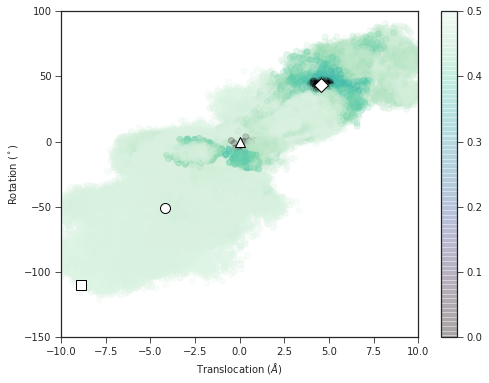

In [34]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

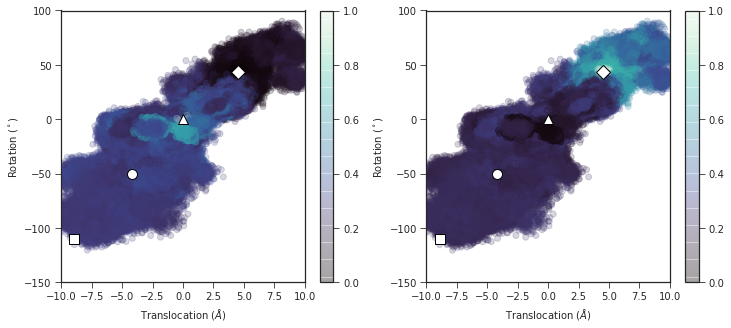

In [35]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [23]:
def svd_whiten(X, num_retain=None):
    U, L, V = np.linalg.svd(X, full_matrices=False)
    if num_retain is None:
        return U
    else:
        return U[:, :num_retain]

In [24]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(3000000, 130)
(3000000, 130)


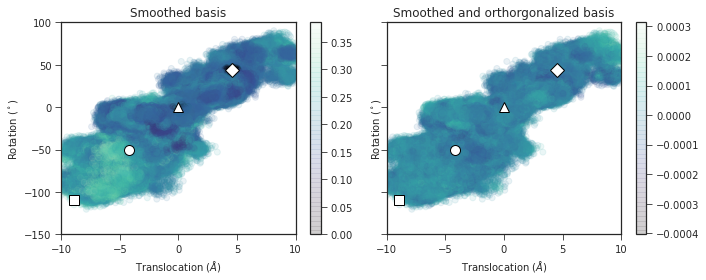

In [38]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [25]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (10000, 130)
237
237


In [26]:
# unit is 0.1 ps, up to 500 ns
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 3000, 4000, 5000]

# COM 

In [44]:
with np.load("../../data/raw_feat/feat5_raw.npz", allow_pickle=True) as f:
    feat5_trajs = f["arr_0"]
feat5_trajs = list(feat5_trajs)
for idx in sorted(remove, reverse=True):
    del feat5_trajs[idx]
feat5_trajs = feat5_trajs[1000:]
feat5_arr = np.concatenate(feat5_trajs)
feat5_arr.shape

(3000000, 1924)

In [46]:
# dimensionality reduce using TICA
livac = ivac.LinearIVAC(minlag=1, maxlag=10000, nevecs=10, addones=False, adjust=True)
livac.fit(feat5_trajs)
ivac_trajs = livac.transform(feat5_trajs)
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

(3000000, 10)


In [47]:
# cluster for indicator basis
km = pyemma.coordinates.cluster_mini_batch_kmeans(data=ivac_arr, k=200, n_jobs=38)

16-06-21 12:21:06 pyemma.coordinates.clustering.kmeans.MiniBatchKmeansClustering[0] INFO     Cluster centers converged after 8 steps.


In [48]:
km.describe()

'[Kmeans, k=200, inp_dim=10]'

In [49]:
data_km_arr = km.dtrajs[0]

In [50]:
data_km_arr.shape

(3000000,)

In [28]:
# indicator basis
ind_basis = np.zeros((len(data_arr), 200))
for i in range(200):
    ind_basis[data_km_arr == i, i] = 1

In [53]:
np.save("../../data/raw_feat/feat5_ind200_anton.npy", data_km_arr)

In [27]:
data_km_arr = np.load("../../data/raw_feat/feat5_ind200_anton.npy")

In [29]:
basisL = np.split(ind_basis, traj_inds)
print(len(basisL), basisL[0].shape)

237 (10000, 200)


In [55]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.89095e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 2


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=6.1829e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 5


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.79725e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 10


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.76385e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 20


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.92336e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 50


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=5.03463e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 100


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=6.42716e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 200


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=5.00028e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 500


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.88431e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 1000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.94611e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


In [56]:
np.save("../../data/coms_feat5_ind200_anton", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [33]:
weights = list(np.load("../../data/coms_feat5_ind200_anton.npy", allow_pickle=True))

In [34]:
# 2000 - 5000 lags
for lag in lags[-4:]:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisL, lag)
    weights.append(com)

Computing change of measure for lag 2000
Computing change of measure for lag 3000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.64794e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 4000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=6.17187e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 5000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=9.64588e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


In [35]:
print(len(weights), len(weights[0]), len(weights[0][0]))

14 237 10000


In [36]:
np.save("../../data/coms_feat5_ind200_anton", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


# committors 

In [36]:
in_domain = np.split(mask, traj_inds)
q_downup, q_updown = [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    q_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


In [37]:
np.save("../../data/feat3_dist_anton/100/q_downup", q_downup)
np.save("../../data/feat3_dist_anton/100/q_updown", q_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [161]:
q_downup = list(
    np.load("../../data/feat3_dist_anton/100/q_downup.npy", allow_pickle=True)
)
q_updown = list(
    np.load("../../data/feat3_dist_anton/100/q_updown.npy", allow_pickle=True)
)

In [39]:
in_domain = np.split(mask, traj_inds)
for (lag, com) in zip(lags[-4:], weights[-4:]):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    q_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))

Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [40]:
np.save("../../data/feat3_dist_anton/100/q_downup", q_downup)
np.save("../../data/feat3_dist_anton/100/q_updown", q_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## Forward committor 

ValueError: 'c' argument has 300000 elements, which is inconsistent with 'x' and 'y' with size 150000.

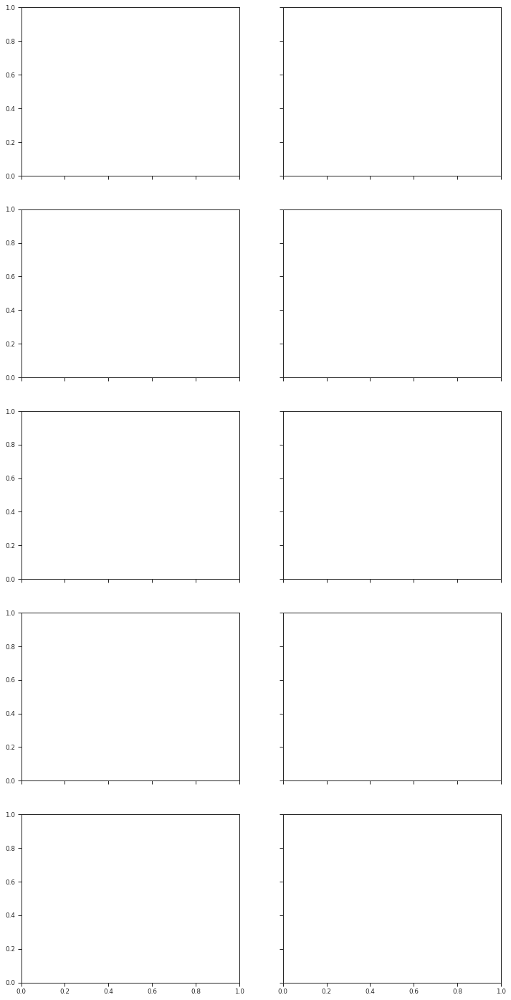

In [162]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags[:10], q_downup[:10], axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()
# f.savefig('../../fig/committors/q_feat3_anton_activation_alllags_ds', dpi=300)

In [38]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids_uu = [48, 54, 53, 59]

In [39]:
from itertools import combinations

In [40]:
feat2_models = np.load("../../data/models_feat2.npy")

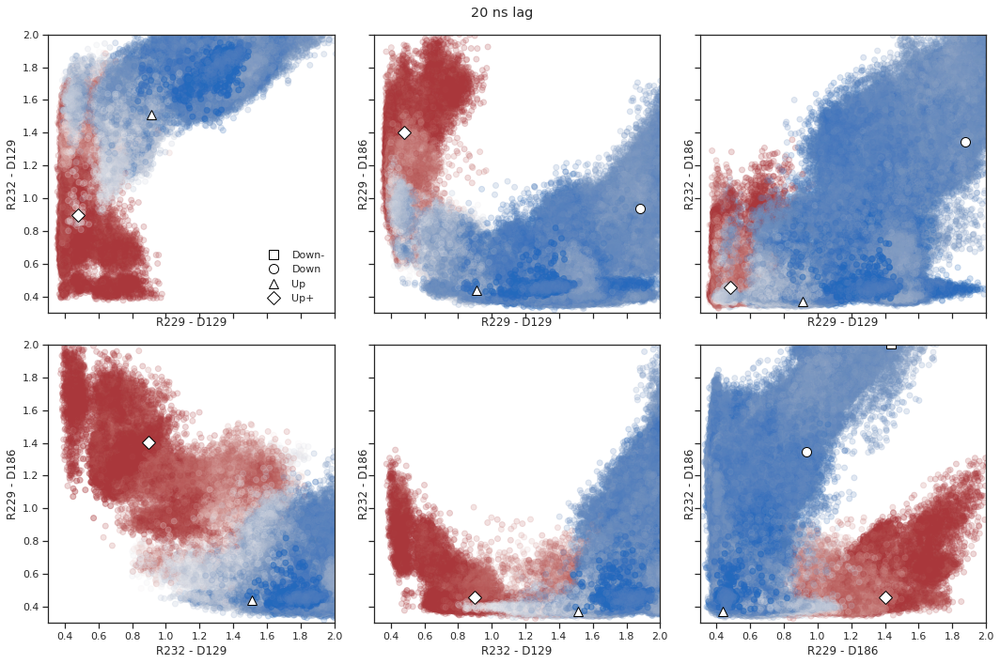

In [78]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        sb_data_arr[::10, sb1],
        sb_data_arr[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_anton_activation_lag200_uuu", dpi=300)

In [100]:
np.save("../../data/feat3_dist_anton/100/q_downup", q_downup)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


## Forward committor deactivation

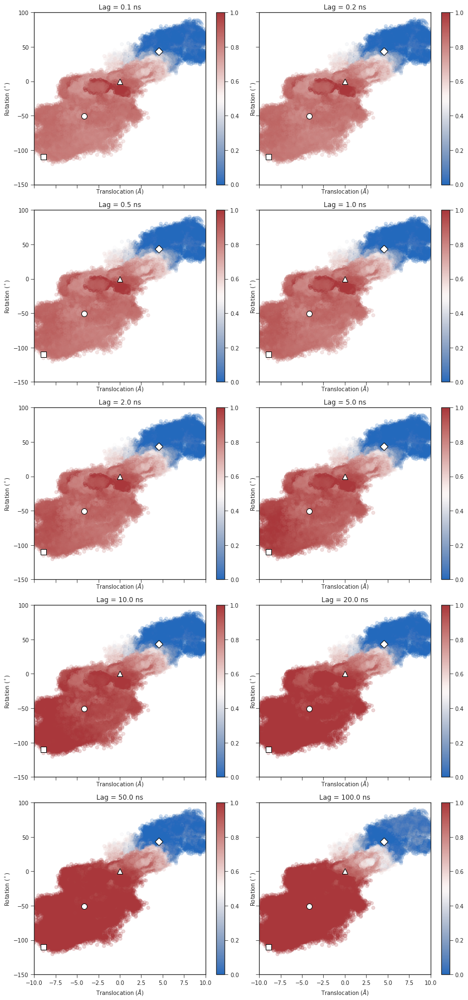

In [41]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_updown, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()

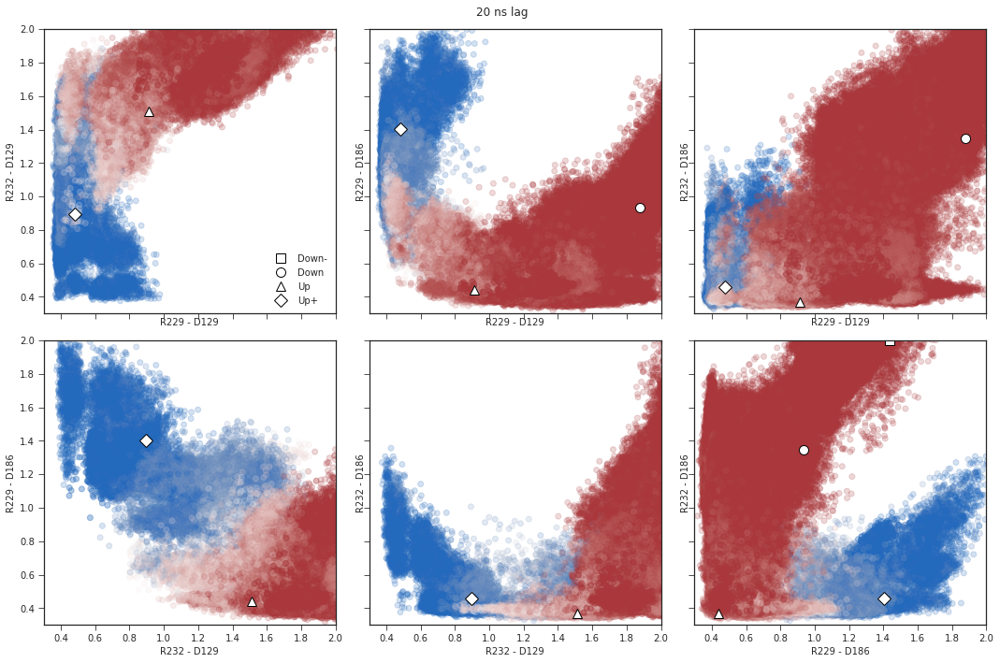

In [42]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_updown[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        sb_data_arr[::10, sb1],
        sb_data_arr[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()

## Rate calculations 

In [43]:
# calculate backward committors
qb_downup, qb_updown = [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


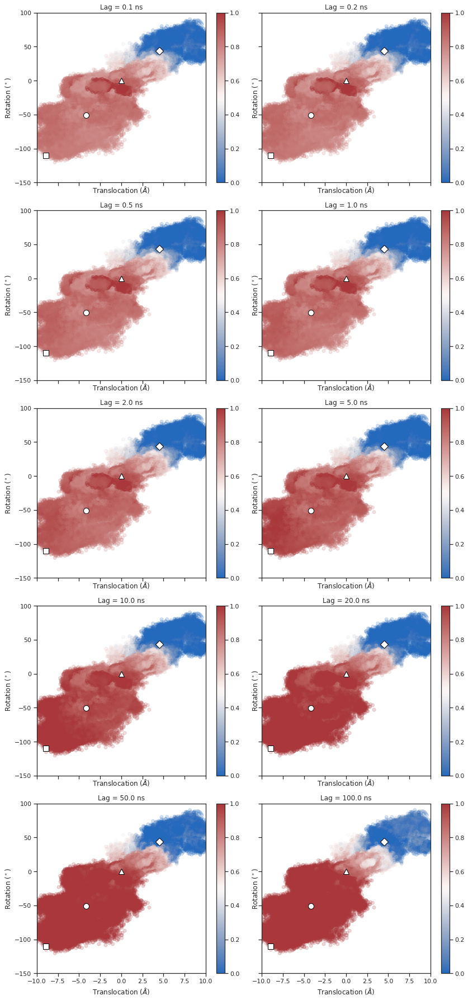

In [75]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, qb_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::10].T, c=q_arr[::10], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()
f.savefig("../../fig/committors/qb_feat3_anton_activation_alllags_ds", dpi=300)

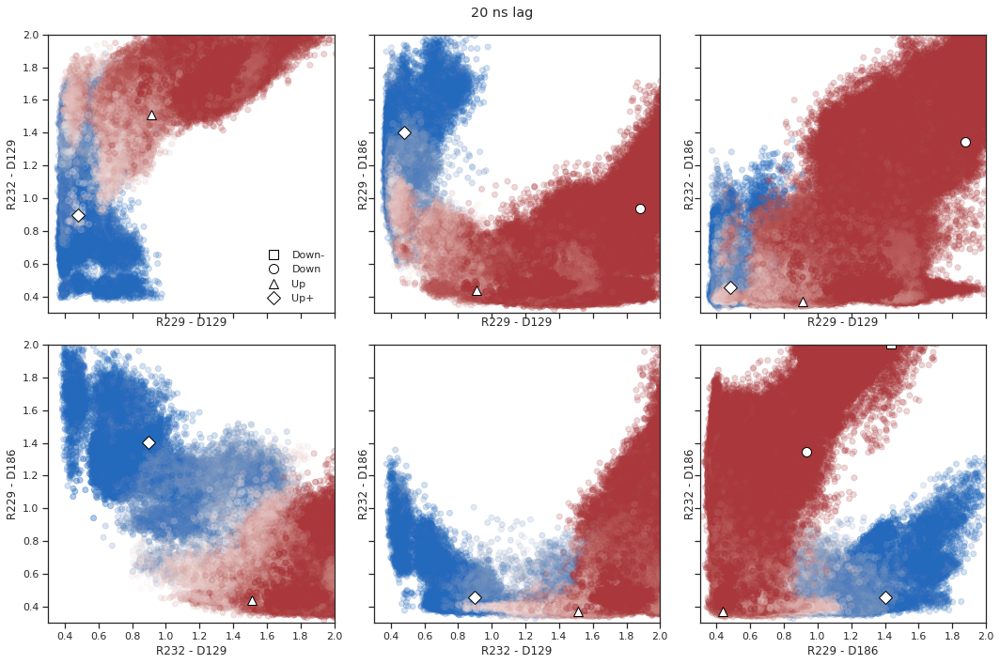

In [76]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(qb_downup[7]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        sb_data_arr[::10, sb1],
        sb_data_arr[::10, sb2],
        c=q_arr[::10],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()
f.savefig("../../fig/committors/qb_feat3_anton_activation_lag200_uuu", dpi=300)

In [46]:
np.save("../../data/feat3_dist_anton/100/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton/100/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [44]:
qb_downup = list(
    np.load("../../data/feat3_dist_anton/100/qb_downup.npy", allow_pickle=True)
)
qb_updown = list(
    np.load("../../data/feat3_dist_anton/100/qb_updown.npy", allow_pickle=True)
)

In [45]:
for (lag, com) in zip(lags[-4:], weights[-4:]):
    print(f"Calculating committors for lag {lag}")
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 2000
Calculating committors for lag 3000
Calculating committors for lag 4000
Calculating committors for lag 5000


In [46]:
np.save("../../data/feat3_dist_anton/100/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton/100/qb_updown", qb_updown)

In [47]:
d_up_arr.shape

(3000000, 1)

In [53]:
dist_ratio = d_up_arr / (d_up_arr + d_upp_arr)
assert dist_ratio[up_ids].all() == False
assert dist_ratio[upplus_ids].all() == True

In [58]:
dist_ratio[0].shape

(10000, 1)

In [60]:
(d_up_arr > d_upp_arr).shape

(3000000, 1)

In [47]:
# rate calculations with different choice of reaction coordinate
rates_q = []  # reaction coordinate as forward committor
rates_qb = []  # 1 - backward committor
rates_Ac = []  # 1_{A^c}
in_ac = np.ones(len(cv_arr))
in_ac[up_ids] = 0
in_ac = np.split(in_ac, traj_inds)

rates_B = []  # 1_B
in_B = np.zeros(len(cv_arr))
in_B[upplus_ids] = 1
in_B = np.split(in_B, traj_inds)

rates_da_db = []  # d_A / (d_A + d_B)
dist_ratio = np.split(np.squeeze(d_up_arr / (d_up_arr + d_upp_arr)), traj_inds)

rates_da_ge_db = []  # 1_{d_A > d_B}
da_ge_db = np.split(np.squeeze(d_up_arr > d_upp_arr), traj_inds)

for (lag, q, qb, com) in zip(lags, q_downup, qb_downup, weights):
    print(f"Calculating rates for lag {lag}")
    # clip committors
    q = [committor.clip(min=0, max=1) for committor in q]
    qb = [committor.clip(min=0, max=1) for committor in qb]
    rates_q.append(extq.tpt.rate(q, qb, com, in_domain, q, lag))
    qb_rxn_coord = [(1 - committor) for committor in qb]
    rates_qb.append(extq.tpt.rate(q, qb, com, in_domain, qb_rxn_coord, lag))
    rates_Ac.append(extq.tpt.rate(q, qb, com, in_domain, in_ac, lag))
    rates_B.append(extq.tpt.rate(q, qb, com, in_domain, in_B, lag))
    rates_da_db.append(extq.tpt.rate(q, qb, com, in_domain, dist_ratio, lag))
    rates_da_ge_db.append(extq.tpt.rate(q, qb, com, in_domain, da_ge_db, lag))

Calculating rates for lag 1
Calculating rates for lag 2
Calculating rates for lag 5
Calculating rates for lag 10
Calculating rates for lag 20
Calculating rates for lag 50
Calculating rates for lag 100
Calculating rates for lag 200
Calculating rates for lag 500
Calculating rates for lag 1000
Calculating rates for lag 2000
Calculating rates for lag 3000
Calculating rates for lag 4000
Calculating rates for lag 5000


In [48]:
all_rates = np.stack(
    (rates_q, rates_qb, rates_Ac, rates_B, rates_da_db, rates_da_ge_db)
)

In [49]:
all_rates.shape

(6, 14)

In [50]:
np.save("../../data/feat3_dist_anton/100/rates_all.npy", all_rates)

In [117]:
all_rates = np.load("../../data/feat3_dist_anton/100/rates_all.npy")

In [51]:
sns.set_context("paper")

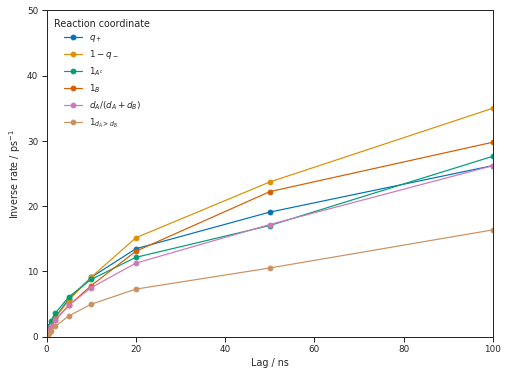

In [53]:
f = plt.figure(figsize=(8, 6))
ax = f.add_subplot(111)
lag_times = np.asarray(lags) * 0.1
for r in all_rates:
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax.plot(lag_times, 1 / r * 0.0001, "-o")
ax.set(
    xlabel="Lag / ns", ylabel="Inverse rate / ps$^{-1}$", xlim=[0, 100], ylim=[0, 50]
)
ax.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
)
# plt.savefig('../../fig/rates/feat3_anton_activation', dpi=300)

# Calculations with data subsampled by 2 (50%)

In [80]:
sb_data = [traj[::2] for traj in sb_data]
sb_data_arr = np.concatenate(sb_data)
cv_trajs = [traj[::2] for traj in cv_trajs]
cv_arr = np.concatenate(cv_trajs)
print(sb_data_arr.shape, cv_arr.shape)

(1500000, 60) (1500000, 2)


In [81]:
livac_trajs = [traj[::2] for traj in livac_trajs]
livac_arr = np.concatenate(livac_trajs)

In [82]:
data_trajs = [traj[::2] for traj in data_trajs]
data_arr = np.concatenate(data_trajs)
print(data_arr.shape)

(1500000, 130)


# States
(50% data)

In [83]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = sb_data_arr[:, 47]  # R2-D186
sb6 = sb_data_arr[:, 53]  # R3-D186
sb7 = sb_data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [84]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data_arr[upplus_ids]
up = data_arr[up_ids]
other = data_arr[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
upplus_sbs = sb_data_arr[upplus_ids]
up_sbs = sb_data_arr[up_ids]
other_sbs = cv_arr[mask]

In [85]:
assert (len(uppplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(uppplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of up+ structures:  12213
Number of up structures:   4592
Number of other structures: 1483195


# Pairwise distances

### Up state 

In [76]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

1.95% completed
3.90% completed
5.85% completed
7.79% completed
9.74% completed
11.69% completed
13.64% completed
15.59% completed
17.54% completed
19.49% completed
21.43% completed
23.38% completed
25.33% completed
27.28% completed
29.23% completed
31.18% completed
33.13% completed
35.07% completed
37.02% completed
38.97% completed
40.92% completed
42.87% completed
44.82% completed
46.76% completed
48.71% completed
50.66% completed
52.61% completed
54.56% completed
56.51% completed
58.46% completed
60.40% completed
62.35% completed
64.30% completed
66.25% completed
68.20% completed
70.15% completed
72.10% completed
74.04% completed
75.99% completed
77.94% completed
79.89% completed
81.84% completed
83.79% completed
85.74% completed
87.68% completed
89.63% completed
91.58% completed
93.53% completed
95.48% completed
97.43% completed
99.38% completed
100.00% completed


In [77]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

52 (29228,)
(1500000, 1)
9.83025e-07
0.0
(1500000, 1)


In [78]:
np.save("../../data/feat3_dist_anton/50/dist_up", d_up_arr)

In [87]:
d_up_arr = np.load("../../data/feat3_dist_anton/50/dist_up.npy")

### Up+state

In [ ]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, uppplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.73% completed
1.47% completed
2.20% completed
2.93% completed
3.66% completed
4.40% completed
5.13% completed
5.86% completed
6.59% completed
7.33% completed
8.06% completed
8.79% completed
9.52% completed
10.26% completed
10.99% completed
11.72% completed
12.45% completed
13.19% completed
13.92% completed
14.65% completed
15.38% completed
16.12% completed
16.85% completed
17.58% completed
18.32% completed
19.05% completed
19.78% completed
20.51% completed
21.25% completed
21.98% completed
22.71% completed
23.44% completed
24.18% completed
24.91% completed
25.64% completed
26.37% completed
27.11% completed
27.84% completed
28.57% completed
29.30% completed
30.04% completed
30.77% completed
31.50% completed
32.23% completed
32.97% completed
33.70% completed
34.43% completed
35.16% completed
35.90% completed
36.63% completed
37.36% completed
38.10% completed
38.83% completed
39.56% completed
40.29% completed
41.03% completed
41.76% completed


In [ ]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

In [ ]:
np.save("../../data/feat3_dist_anton/50/dist_upplus", d_upp_arr)

In [88]:
d_upp_arr = np.load("../../data/feat3_dist_anton/50/dist_upplus.npy")

## Smoothing, whitening/basis construction

In [89]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [90]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(1500000, 1) (1500000, 1) (1500000, 1)


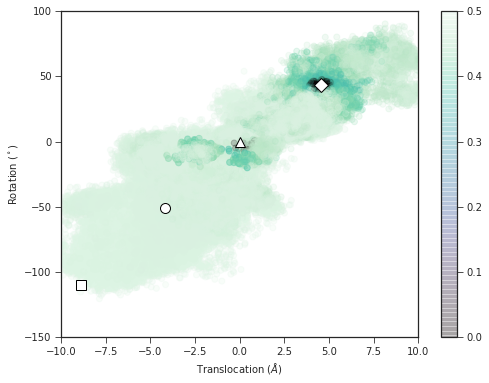

In [84]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

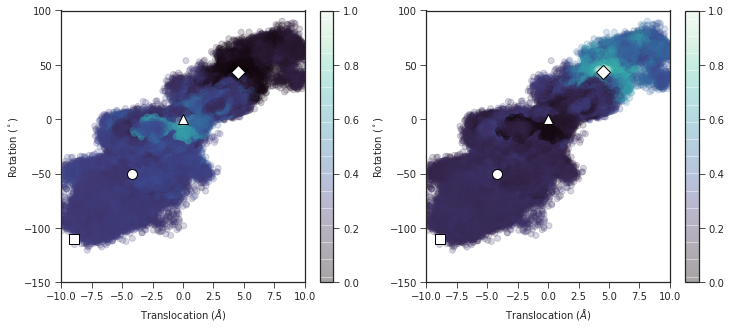

In [85]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [91]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(1500000, 130)
(1500000, 130)


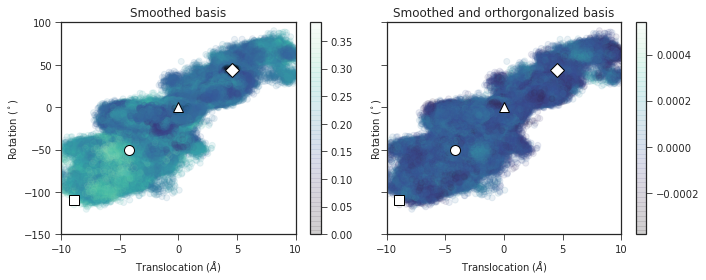

In [88]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [92]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (5000, 130)
237
237


# Change of measure 

In [90]:
feat5_trajs = [traj[::2] for traj in feat5_trajs]
feat5_arr = np.concatenate(feat5_trajs)
print(feat5_arr.shape)

(1500000, 1924)


In [91]:
# dimensionality reduce using TICA
livac = ivac.LinearIVAC(minlag=1, maxlag=10000, nevecs=10, addones=False, adjust=True)
livac.fit(feat5_trajs)
ivac_trajs = livac.transform(feat5_trajs)
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

(1500000, 10)


In [92]:
# cluster for indicator basis
km_2 = pyemma.coordinates.cluster_mini_batch_kmeans(data=ivac_arr, k=200, n_jobs=38)

16-06-21 15:37:48 pyemma.coordinates.clustering.kmeans.MiniBatchKmeansClustering[2] INFO     Algorithm did not reach convergence criterion of 1e-05 in 10 iterations. Consider increasing max_iter.


In [93]:
km_2.describe()

'[Kmeans, k=200, inp_dim=10]'

In [94]:
data_km_arr = km_2.dtrajs[0]

In [95]:
data_km_arr.shape

(1500000,)

In [94]:
# indicator basis
ind_basis = np.zeros((len(data_arr), 200))
for i in range(200):
    ind_basis[data_km_arr == i, i] = 1

In [97]:
np.save("../../data/raw_feat/feat5_ind200_anton_half.npy", data_km_arr)

In [93]:
data_km_arr = np.load("../../data/raw_feat/feat5_ind200_anton_half.npy")

In [95]:
basisL = np.split(ind_basis, traj_inds)
print(len(basisL), basisL[0].shape)

237 (5000, 200)


In [96]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=9.6209e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 2


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.60923e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 5


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.11393e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 10


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.74482e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 20


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.31677e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 50


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.5986e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 100


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.12974e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 200


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.3652e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 500


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.95647e-20): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 1000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.41077e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


In [97]:
np.save("../../data/coms_feat5_ind200_anton_half.npy", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


# committors 

In [98]:
# lags are twice as long in real time since every other data point is taken
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


In [99]:
np.save("../../data/feat3_dist_anton/50/q_downup", q_downup)
np.save("../../data/feat3_dist_anton/50/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton/50/q_updown", q_updown)
np.save("../../data/feat3_dist_anton/50/qb_updown", qb_updown)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


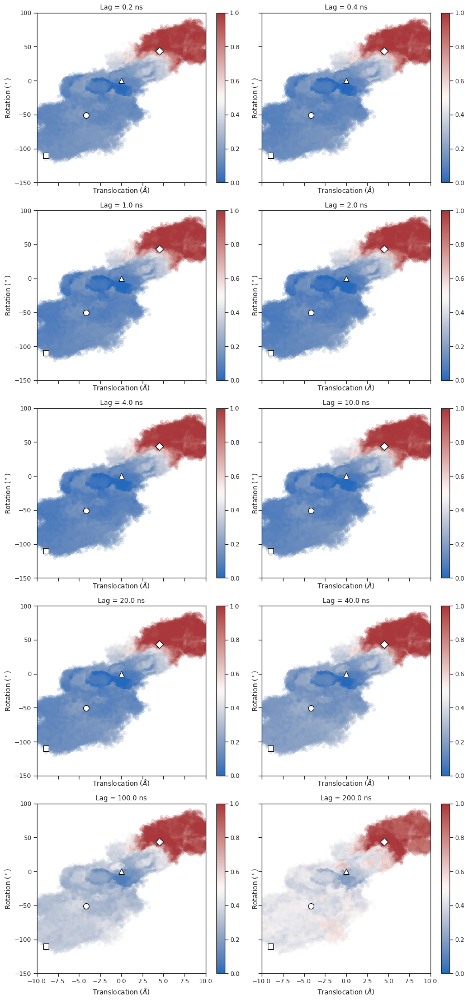

In [100]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::5].T, c=q_arr[::5], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.2} ns")
    util.format_cvs(ax)
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_antonhalf_activation_alllags_ds", dpi=300)

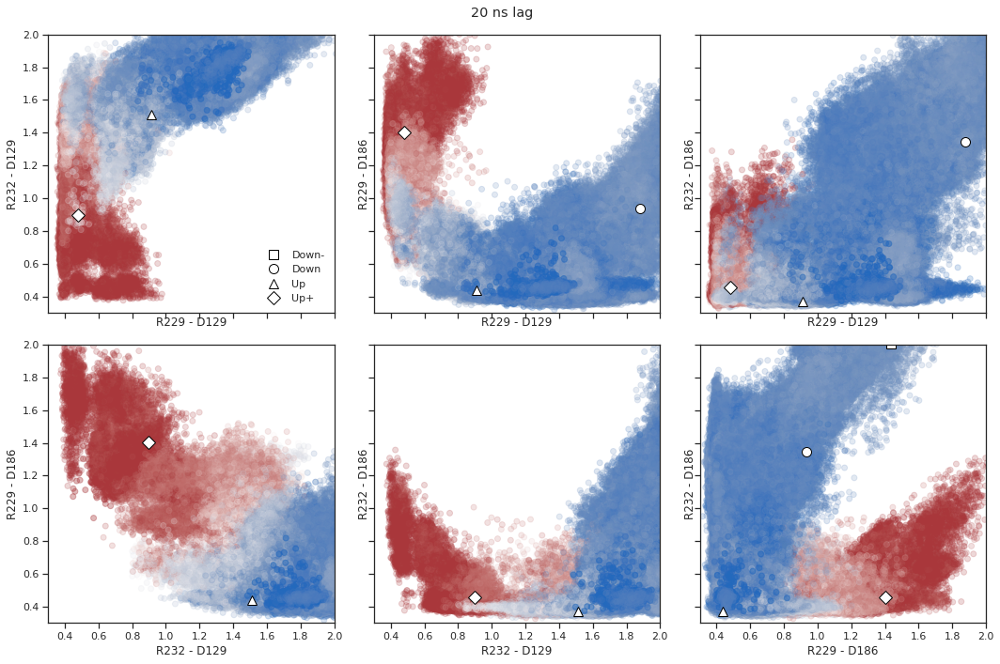

In [101]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[6]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        sb_data_arr[::5, sb1],
        sb_data_arr[::5, sb2],
        c=q_arr[::5],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_antonhalf_activation_lag200_uuu", dpi=300)

## Rates 

In [102]:
# rate calculations with different choice of reaction coordinate
rates_q = []  # reaction coordinate as forward committor
rates_qb = []  # 1 - backward committor
rates_Ac = []  # 1_{A^c}
in_ac = np.ones(len(cv_arr))
in_ac[up_ids] = 0
in_ac = np.split(in_ac, traj_inds)

rates_B = []  # 1_B
in_B = np.zeros(len(cv_arr))
in_B[upplus_ids] = 1
in_B = np.split(in_B, traj_inds)

rates_da_db = []  # d_A / (d_A + d_B)
dist_ratio = np.split(np.squeeze(d_up_arr / (d_up_arr + d_upp_arr)), traj_inds)

rates_da_ge_db = []  # 1_{d_A > d_B}
da_ge_db = np.split(np.squeeze(d_up_arr > d_upp_arr), traj_inds)

for (lag, q, qb, com) in zip(lags, q_downup, qb_downup, weights):
    print(f"Calculating rates for lag {lag}")
    # clip committors
    q = [committor.clip(min=0, max=1) for committor in q]
    qb = [committor.clip(min=0, max=1) for committor in qb]
    rates_q.append(extq.tpt.rate(q, qb, com, in_domain, q, lag))
    qb_rxn_coord = [(1 - committor) for committor in qb]
    rates_qb.append(extq.tpt.rate(q, qb, com, in_domain, qb_rxn_coord, lag))
    rates_Ac.append(extq.tpt.rate(q, qb, com, in_domain, in_ac, lag))
    rates_B.append(extq.tpt.rate(q, qb, com, in_domain, in_B, lag))
    rates_da_db.append(extq.tpt.rate(q, qb, com, in_domain, dist_ratio, lag))
    rates_da_ge_db.append(extq.tpt.rate(q, qb, com, in_domain, da_ge_db, lag))

Calculating rates for lag 1
Calculating rates for lag 2
Calculating rates for lag 5
Calculating rates for lag 10
Calculating rates for lag 20
Calculating rates for lag 50
Calculating rates for lag 100
Calculating rates for lag 200
Calculating rates for lag 500
Calculating rates for lag 1000


In [103]:
all_rates = np.stack(
    (rates_q, rates_qb, rates_Ac, rates_B, rates_da_db, rates_da_ge_db)
)

In [104]:
all_rates.shape

(6, 10)

In [105]:
np.save("../../data/feat3_dist_anton/50/rates_all.npy", all_rates)

In [119]:
all_rates = np.load("../../data/feat3_dist_anton/50/rates_all.npy")

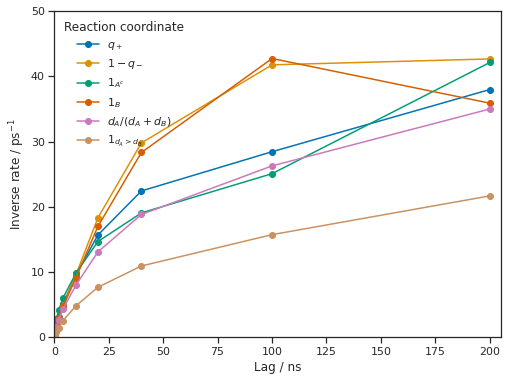

In [120]:
f = plt.figure(figsize=(8, 6))
ax = f.add_subplot(111)
lag_times = np.asarray(lags) * 0.2
for r in all_rates:
    # units are 0.2 ns, inverse rates in 5 ns^-1
    ax.plot(lag_times, 1 / r * 0.0002, "-o")
ax.set(
    xlabel="Lag / ns", ylabel="Inverse rate / ps$^{-1}$", xlim=[0, 205], ylim=[0, 50]
)
# ax.set_xscale('log')
# ax.set_yscale('log')
ax.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)
plt.savefig("../../fig/rates/feat3_antonhalf_activation", dpi=300)

# Subsample x4 (25% original data)

In [121]:
sb_data = [traj[::2] for traj in sb_data]
sb_data_arr = np.concatenate(sb_data)
cv_trajs = [traj[::2] for traj in cv_trajs]
cv_arr = np.concatenate(cv_trajs)
livac_trajs = [traj[::2] for traj in livac_trajs]
livac_arr = np.concatenate(livac_trajs)
data_trajs = [traj[::2] for traj in data_trajs]
data_arr = np.concatenate(data_trajs)
print(sb_data_arr.shape, cv_arr.shape, livac_arr.shape, data_arr.shape)

(750000, 60) (750000, 2) (750000, 5) (750000, 130)


# States
(25% data)

In [122]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = sb_data_arr[:, 47]  # R2-D186
sb6 = sb_data_arr[:, 53]  # R3-D186
sb7 = sb_data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [123]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data_arr[upplus_ids]
up = data_arr[up_ids]
other = data_arr[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
upplus_sbs = sb_data_arr[upplus_ids]
up_sbs = sb_data_arr[up_ids]
other_sbs = cv_arr[mask]

In [124]:
assert (len(uppplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(uppplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of up+ structures:  6081
Number of up structures:   2311
Number of other structures: 741608


# Pairwise distances

### Up state 

In [133]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

7.74% completed
15.49% completed
23.23% completed
30.97% completed
38.72% completed
46.46% completed
54.21% completed
61.95% completed
69.69% completed
77.44% completed
85.18% completed
92.92% completed
100.00% completed


In [134]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

13 (58077,)
(750000, 1)
9.536743e-07
0.0
(750000, 1)


In [135]:
np.save("../../data/feat3_dist_anton/25/dist_up", d_up_arr)

In [125]:
d_up_arr = np.load("../../data/feat3_dist_anton/25/dist_up.npy")

### Up+state

In [136]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, uppplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

2.94% completed
5.89% completed
8.83% completed
11.77% completed
14.71% completed
17.66% completed
20.60% completed
23.54% completed
26.49% completed
29.43% completed
32.37% completed
35.31% completed
38.26% completed
41.20% completed
44.14% completed
47.08% completed
50.03% completed
52.97% completed
55.91% completed
58.86% completed
61.80% completed
64.74% completed
67.68% completed
70.63% completed
73.57% completed
76.51% completed
79.46% completed
82.40% completed
85.34% completed
88.28% completed
91.23% completed
94.17% completed
97.11% completed
100.00% completed


In [137]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

34 (22071,)
(750000, 1)
10.392701
0.0
(750000, 1)


In [138]:
np.save("../../data/feat3_dist_anton/25/dist_upplus", d_upp_arr)

In [126]:
d_upp_arr = np.load("../../data/feat3_dist_anton/25/dist_upplus.npy")

## Smoothing, whitening/basis construction

In [127]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [128]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(750000, 1) (750000, 1) (750000, 1)


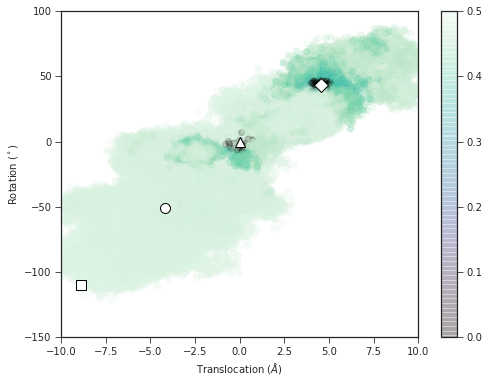

In [147]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::3, 0], cv_arr[::3, 1], c=smooth[::3], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

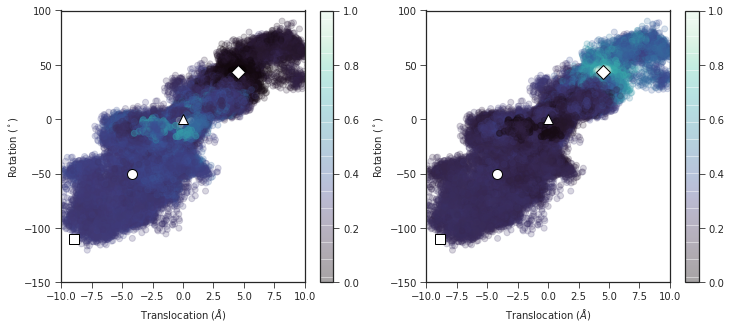

In [142]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [129]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(750000, 130)
(750000, 130)


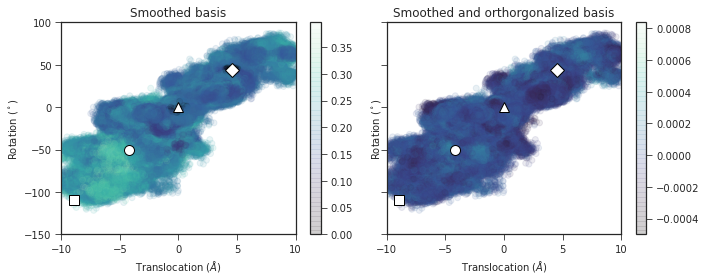

In [148]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::3, 0],
    cv_arr[::3, 1],
    c=np.mean(basis_smooth[::3, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::3, 0],
    cv_arr[::3, 1],
    c=np.mean(basis_white[::3, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [130]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

237 (2500, 130)
237
237


# Change of measure 

In [149]:
feat5_trajs = [traj[::2] for traj in feat5_trajs]
feat5_arr = np.concatenate(feat5_trajs)
print(feat5_arr.shape)

(750000, 1924)


In [ ]:
# dimensionality reduce using TICA
livac = ivac.LinearIVAC(minlag=1, maxlag=10000, nevecs=10, addones=False, adjust=True)
livac.fit(feat5_trajs)
ivac_trajs = livac.transform(feat5_trajs)
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

In [ ]:
# cluster for indicator basis
km_3 = pyemma.coordinates.cluster_mini_batch_kmeans(data=ivac_arr, k=200, n_jobs=38)

In [ ]:
km_3.describe()

In [ ]:
data_km_arr = km_3.dtrajs[0]

In [ ]:
data_km_arr.shape

In [132]:
# indicator basis
ind_basis = np.zeros((len(data_arr), 200))
for i in range(200):
    ind_basis[data_km_arr == i, i] = 1

In [ ]:
np.save("../../data/raw_feat/feat5_ind200_anton_quarter.npy", data_km_arr)

In [131]:
data_km_arr = np.load("../../data/raw_feat/feat5_ind200_anton_quarter.npy")

In [133]:
basisL = np.split(ind_basis, traj_inds)
print(len(basisL), basisL[0].shape)

237 (2500, 200)


In [134]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=5.20537e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 2


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.11826e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 5


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.085e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 10


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=2.42509e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 20


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.59234e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 50


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=3.07782e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 100


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.60173e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 200


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=8.63059e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 500


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.29111e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 1000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.5482e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


In [135]:
np.save("../../data/coms_feat5_ind200_anton_quart.npy", weights)

/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


# committors 

In [136]:
# lags are four times as long in real time since every other data point is taken
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


In [137]:
np.save("../../data/feat3_dist_anton/25/q_downup", q_downup)
np.save("../../data/feat3_dist_anton/25/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton/25/q_updown", q_updown)
np.save("../../data/feat3_dist_anton/25/qb_updown", qb_updown)

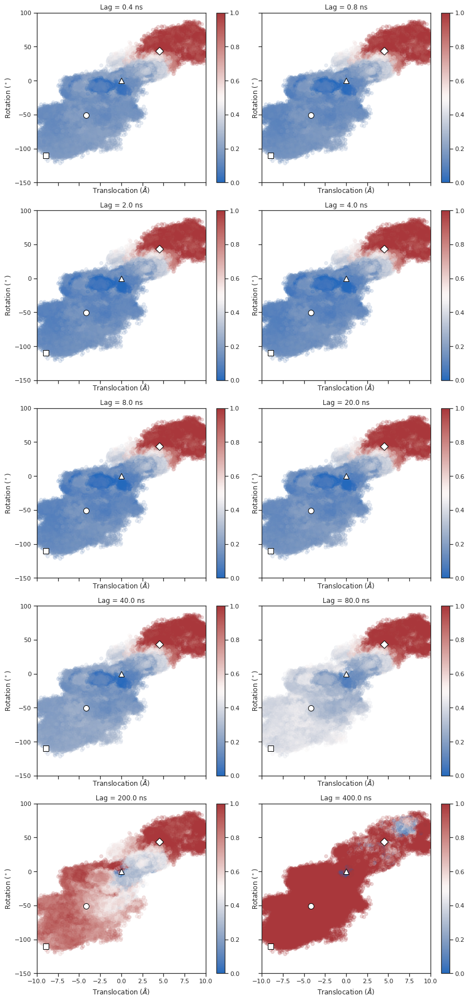

In [138]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags, q_downup, axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::3].T, c=q_arr[::3], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.4} ns")
    util.format_cvs(ax)
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_antonquart_activation_alllags_ds", dpi=300)

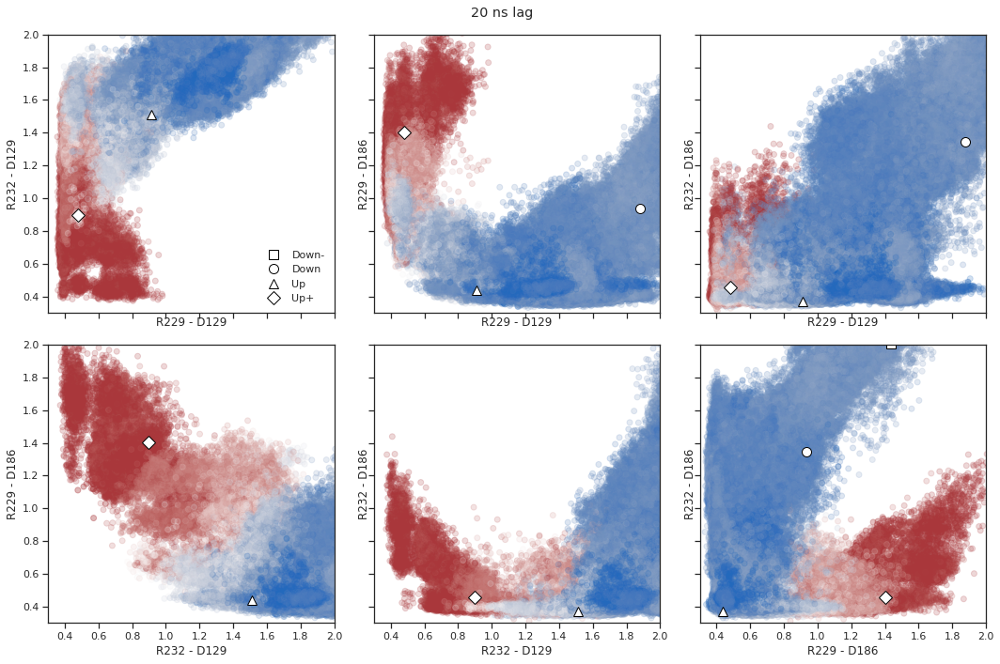

In [139]:
f, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
# 20 ns lag
q_arr = np.concatenate(q_downup[5]).clip(min=0.0, max=1.0)
for ((sb1, sb2), ax) in zip(combinations(sb_ids_uu, 2), axes.flat):
    ax.scatter(
        sb_data_arr[::3, sb1],
        sb_data_arr[::3, sb2],
        c=q_arr[::3],
        cmap="vlag",
        alpha=0.2,
    )
    ax.set(xlabel=sb_labels[sb1 - 30], ylabel=sb_labels[sb2 - 30])

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
util.plot_models(axes[0][0], feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(axes[0][1], feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(axes[0][2], feat2_models[:, 48:60:11])  # 48 and 59
util.plot_models(axes[1][0], feat2_models[:, 54:52:-1])  # indexes 54 and 53
util.plot_models(axes[1][1], feat2_models[:, 54:60:5])  # 54 and 59
util.plot_models(axes[1][2], feat2_models[:, 53:60:6])  # 53 and 59
axes[0][0].legend(["Down-", "Down", "Up", "Up+"])
f.suptitle("20 ns lag")
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_antonquart_activation_lag200_uuu.png", dpi=300)

## Rates 

In [140]:
# rate calculations with different choice of reaction coordinate
rates_q = []  # reaction coordinate as forward committor
rates_qb = []  # 1 - backward committor
rates_Ac = []  # 1_{A^c}
in_ac = np.ones(len(cv_arr))
in_ac[up_ids] = 0
in_ac = np.split(in_ac, traj_inds)

rates_B = []  # 1_B
in_B = np.zeros(len(cv_arr))
in_B[upplus_ids] = 1
in_B = np.split(in_B, traj_inds)

rates_da_db = []  # d_A / (d_A + d_B)
dist_ratio = np.split(np.squeeze(d_up_arr / (d_up_arr + d_upp_arr)), traj_inds)

rates_da_ge_db = []  # 1_{d_A > d_B}
da_ge_db = np.split(np.squeeze(d_up_arr > d_upp_arr), traj_inds)

for (lag, q, qb, com) in zip(lags, q_downup, qb_downup, weights):
    print(f"Calculating rates for lag {lag}")
    # clip committors
    q = [committor.clip(min=0, max=1) for committor in q]
    qb = [committor.clip(min=0, max=1) for committor in qb]
    rates_q.append(extq.tpt.rate(q, qb, com, in_domain, q, lag))
    qb_rxn_coord = [(1 - committor) for committor in qb]
    rates_qb.append(extq.tpt.rate(q, qb, com, in_domain, qb_rxn_coord, lag))
    rates_Ac.append(extq.tpt.rate(q, qb, com, in_domain, in_ac, lag))
    rates_B.append(extq.tpt.rate(q, qb, com, in_domain, in_B, lag))
    rates_da_db.append(extq.tpt.rate(q, qb, com, in_domain, dist_ratio, lag))
    rates_da_ge_db.append(extq.tpt.rate(q, qb, com, in_domain, da_ge_db, lag))

Calculating rates for lag 1
Calculating rates for lag 2
Calculating rates for lag 5
Calculating rates for lag 10
Calculating rates for lag 20
Calculating rates for lag 50
Calculating rates for lag 100
Calculating rates for lag 200
Calculating rates for lag 500
Calculating rates for lag 1000


In [141]:
all_rates = np.stack(
    (rates_q, rates_qb, rates_Ac, rates_B, rates_da_db, rates_da_ge_db)
)

In [142]:
all_rates.shape

(6, 10)

In [143]:
np.save("../../data/feat3_dist_anton/25/rates_all.npy", all_rates)

In [119]:
all_rates = np.load("../../data/feat3_dist_anton/25/rates_all.npy")

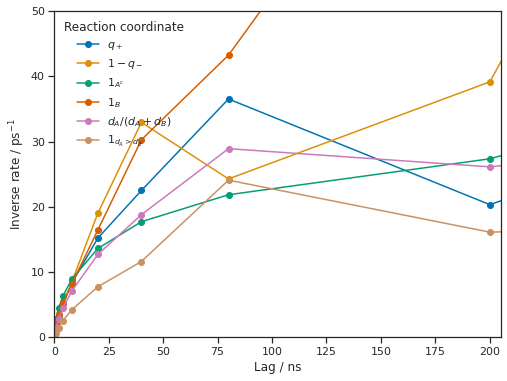

In [146]:
f = plt.figure(figsize=(8, 6))
ax = f.add_subplot(111)
lag_times = np.asarray(lags) * 0.4
for r in all_rates:
    # units are 0.4 ns, inverse rates in 2.5 ns^-1
    ax.plot(lag_times, 1 / r * 0.0004, "-o")
ax.set(
    xlabel="Lag / ns", ylabel="Inverse rate / ps$^{-1}$", xlim=[0, 205], ylim=[0, 50]
)
# ax.set_xscale('log')
# ax.set_yscale('log')
ax.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)
plt.savefig("../../fig/rates/feat3_antonquart_activation", dpi=300)

# Rates (bad)

In [166]:
q_updown = []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


In [181]:
rates_q = []  # reaction coordinate as forward committor
rates_qb = []  # 1 - backward committor
rates_Ac = []  # 1_{A^c}
in_ac = np.ones(len(cv_arr))
in_ac[up_ids] = 0
in_ac = np.split(in_ac, traj_inds)

rates_B = []  # 1_B
in_B = np.zeros(len(cv_arr))
in_B[upplus_ids] = 1
in_B = np.split(in_B, traj_inds)

for (lag, q, qb, com) in zip(lags, q_downup, q_updown, weights):
    print(f"Calculating rates for lag {lag}")
    # clip committors
    q = [committor.clip(min=0, max=1) for committor in q]
    qb = [committor.clip(min=0, max=1) for committor in qb]
    rates_q.append(extq.tpt.rate(q, qb, com, in_domain, q, lag))
    qb_rxn_coord = [(1 - committor) for committor in qb]
    rates_qb.append(extq.tpt.rate(q, qb, com, in_domain, qb_rxn_coord, lag))
    rates_Ac.append(extq.tpt.rate(q, qb, com, in_domain, in_ac, lag))
    rates_B.append(extq.tpt.rate(q, qb, com, in_domain, in_B, lag))

Calculating rates for lag 1
Calculating rates for lag 2
Calculating rates for lag 5
Calculating rates for lag 10
Calculating rates for lag 20
Calculating rates for lag 50
Calculating rates for lag 100
Calculating rates for lag 200
Calculating rates for lag 500
Calculating rates for lag 1000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


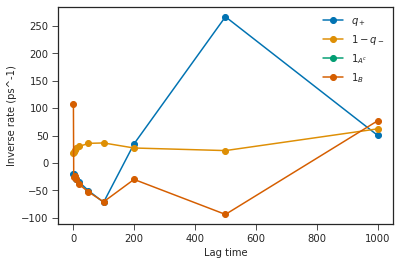

In [186]:
f = plt.figure()
ax = f.add_subplot(111)
ax.plot(lags, 1 / np.asarray(rates_q) * 0.0001, "-o")
ax.plot(lags, 1 / np.asarray(rates_qb) * 0.0001, "-o")
ax.plot(lags, 1 / np.asarray(rates_Ac) * 0.0001, "-o")
ax.plot(lags, 1 / np.asarray(rates_B) * 0.0001, "-o")
ax.set(xlabel="Lag time", ylabel="Inverse rate (ps^-1)")
ax.legend(["$q_+$", "$1 - q_-$", "$1_{A^c}$", "$1_B$"])

# Trajectories subsampled by 2 

6.21.21

In [54]:
import random

In [65]:
# choose 150 random indices from 0 - 237, excluding 179-185
choices = list(range(0, 237))
for i in range(185, 178, -1):
    del choices[i]
print(choices)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228,

In [67]:
indices = random.sample(choices, 150)

In [80]:
livac_trajs = list(livac_trajs)
cv_trajs = list(cv_trajs)
for idx in sorted(indices, reverse=True):
    del livac_trajs[idx]
    del sb_data[idx]
    del cv_trajs[idx]
    del data_trajs[idx]
print(len(livac_trajs), len(sb_data), len(cv_trajs), len(data_trajs))

livac_arr = np.concatenate(livac_trajs)
sb_data_arr = np.concatenate(sb_data)
cv_arr = np.concatenate(cv_trajs)
data_arr = np.concatenate(data_trajs)
print(livac_arr.shape, sb_data_arr.shape, cv_arr.shape, data_arr.shape)

87 87 87 87
(1500000, 5) (1500000, 60) (1500000, 2) (1500000, 130)


In [62]:
len(cv_trajs[186])

10000

# States
(50% data)

In [81]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
tic1 = livac_arr[:, 1]
tic2 = livac_arr[:, 2]
sb5 = sb_data_arr[:, 47]  # R2-D186
sb6 = sb_data_arr[:, 53]  # R3-D186
sb7 = sb_data_arr[:, 59]  # R4-D186


# ellipse centered at (4.535, 43.7) with radii 0.632 and 2.9 for up+ state
# take points where TIC 1 < -1.25
dist_ax_upp = (dist - 4.535) / 0.632
rot_ax_upp = (rot - 43.7) / 4.0
upplus_ids = (((dist_ax_upp ** 2 + rot_ax_upp ** 2) < 1) & (tic1 < -1.25)).nonzero()[0]

# ellipse centered at (0, 0) with radii 0.84 nm and 7.6 deg (2 sigma in each direction) for up state
# take points where TIC 2 > -1.0 and R3/R4-D186 salt bridges < 0.5/0.6 nm, R2-D186 > 1
up_ids = (
    (((dist / 0.84) ** 2 + (rot / 7.6) ** 2) < 1)
    & (sb6 < 0.5)
    & (sb7 < 0.6)
    & (sb5 > 1.0)
    & (tic2 > -1)
).nonzero()[0]

In [82]:
mask = np.ones(len(cv_arr), dtype=bool)
mask[upplus_ids] = False
mask[up_ids] = False

# len(**_ids) is number of points in each state
uppplus = data_arr[upplus_ids]
up = data_arr[up_ids]
other = data_arr[mask]

# split CV data
upplus_cvs = cv_arr[upplus_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
upplus_sbs = sb_data_arr[upplus_ids]
up_sbs = sb_data_arr[up_ids]
other_sbs = cv_arr[mask]

In [83]:
assert (len(uppplus) + len(up) + len(other)) == len(cv_arr)
print(f"Number of up+ structures:  {len(uppplus)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of up+ structures:  12187
Number of up structures:   2207
Number of other structures: 1485606


# Pairwise distances

### Up state 

In [89]:
d_up = []
counter = 0.0
tot = len(data_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, up[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

4.05% completed
8.11% completed
12.16% completed
16.22% completed
20.27% completed
24.33% completed
28.38% completed
32.43% completed
36.49% completed
40.54% completed
44.60% completed
48.65% completed
52.71% completed
56.76% completed
60.81% completed
64.87% completed
68.92% completed
72.98% completed
77.03% completed
81.09% completed
85.14% completed
89.19% completed
93.25% completed
97.30% completed
100.00% completed


In [90]:
print(len(d_up), d_up[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
print(d_up_arr.shape)
print(np.max(d_up_arr[up_ids]))
d_up_arr[up_ids] = 0
print(np.max(d_up_arr[up_ids]))

print(d_up_arr.shape)

25 (60814,)
(1500000, 1)
9.83025e-07
0.0
(1500000, 1)


In [92]:
np.save("../../data/feat3_dist_anton/half/dist_up", d_up_arr)

In [87]:
d_up_arr = np.load("../../data/feat3_dist_anton/half/dist_up.npy")

### Up+state

In [93]:
d_upp = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    data_arr, uppplus[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_upp.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.73% completed
1.47% completed
2.20% completed
2.94% completed
3.67% completed
4.41% completed
5.14% completed
5.87% completed
6.61% completed
7.34% completed
8.08% completed
8.81% completed
9.54% completed
10.28% completed
11.01% completed
11.75% completed
12.48% completed
13.22% completed
13.95% completed
14.68% completed
15.42% completed
16.15% completed
16.89% completed
17.62% completed
18.36% completed
19.09% completed
19.82% completed
20.56% completed
21.29% completed
22.03% completed
22.76% completed
23.49% completed
24.23% completed
24.96% completed
25.70% completed
26.43% completed
27.17% completed
27.90% completed
28.63% completed
29.37% completed
30.10% completed
30.84% completed
31.57% completed
32.30% completed
33.04% completed
33.77% completed
34.51% completed
35.24% completed
35.98% completed
36.71% completed
37.44% completed
38.18% completed
38.91% completed
39.65% completed
40.38% completed
41.12% completed
41.85% completed
42.58% completed
43.32% completed
44.05% com

In [94]:
print(len(d_upp), d_upp[0].shape)

# Set all distances of point in monomer state to be 0 explicitly
d_upp_arr = np.reshape(np.concatenate(d_upp), (-1, 1))
print(d_upp_arr.shape)
print(np.max(d_up_arr[upplus_ids]))
d_upp_arr[upplus_ids] = 0
print(np.max(d_upp_arr[upplus_ids]))

print(d_upp_arr.shape)

137 (11013,)
(1500000, 1)
9.572008
0.0
(1500000, 1)


In [95]:
np.save("../../data/feat3_dist_anton/half/dist_upplus", d_upp_arr)

In [88]:
d_upp_arr = np.load("../../data/feat3_dist_anton/50/dist_upplus.npy")

## Smoothing, whitening/basis construction

In [96]:
# make smoothing function
smooth = (d_up_arr * d_upp_arr) ** 0.5 / (d_up_arr + d_upp_arr)

# make guess
guess_up = (d_upp_arr / (d_up_arr + d_upp_arr)) ** 2
guess_upp = (d_up_arr / (d_up_arr + d_upp_arr)) ** 2

# make smoothing 0 at boundaries (up and up+ states)
smooth[(mask == 0).flatten()] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[upplus_ids] = 0
guess_upp[upplus_ids] = 1
guess_upp[up_ids] = 0

In [97]:
print(smooth.shape, guess_up.shape, guess_upp.shape)

(1500000, 1) (1500000, 1) (1500000, 1)


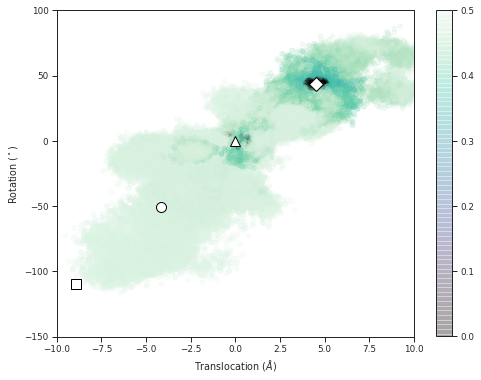

In [98]:
# Plot smoothing function
fig, ax = plt.subplots(figsize=(8, 6))
h = ax.scatter(cv_arr[::10, 0], cv_arr[::10, 1], c=smooth[::10], alpha=0.2, cmap="mako")
plt.colorbar(h, ax=ax)
util.format_cvs(ax)

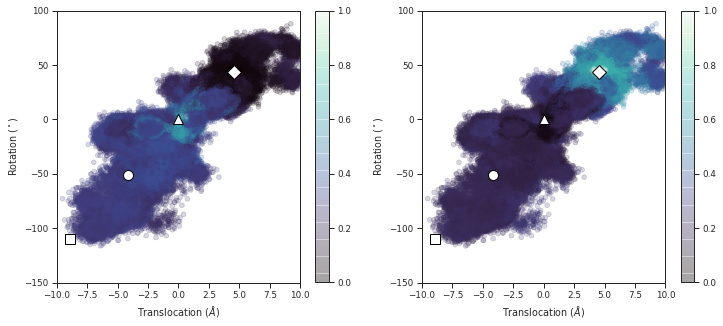

In [99]:
# Plot up and up+ state guess function
fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 5))
h0 = ax0.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_up[::10], alpha=0.2, cmap="mako"
)
h1 = ax1.scatter(
    cv_arr[::10, 0], cv_arr[::10, 1], c=guess_upp[::10], alpha=0.2, cmap="mako"
)
plt.colorbar(h0, ax=ax0)
plt.colorbar(h1, ax=ax1)
util.format_cvs(ax0)
util.format_cvs(ax1)

### SVD 

In [100]:
basis_smooth = smooth * data_arr
print(basis_smooth.shape)
# basis_white, L = util.svd_whiten(basis_smooth, 1, frac_retain=1.)
basis_white = svd_whiten(basis_smooth)
basis_white[(mask == 0).flatten()] = 0
print(basis_white.shape)

(1500000, 130)
(1500000, 130)


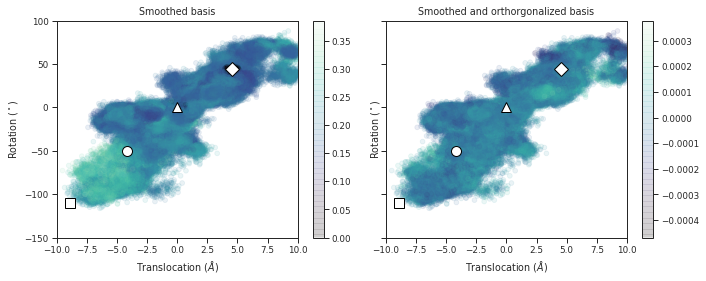

In [101]:
# plot bases
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True, sharey=True)
h1 = ax1.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_smooth[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
h2 = ax2.scatter(
    cv_arr[::10, 0],
    cv_arr[::10, 1],
    c=np.mean(basis_white[::10, :], axis=1),
    alpha=0.1,
    cmap="mako",
)
for ax in (ax1, ax2):
    util.format_cvs(ax)
ax1.set_title("Smoothed basis")
ax2.set_title("Smoothed and orthorgonalized basis")
plt.colorbar(h1, ax=ax1)
plt.colorbar(h2, ax=ax2)
f.tight_layout()

### Make bases

In [102]:
traj_lens = [len(traj) for traj in cv_trajs]
traj_inds = []
subtot = 0
for length in traj_lens[:-1]:
    subtot += length
    traj_inds.append(subtot)

basisF = np.split(basis_white, traj_inds)
# "down" state is up, "up" state is up+
guessD = np.split(np.squeeze(guess_up), traj_inds)
guessU = np.split(np.squeeze(guess_upp), traj_inds)

print(len(basisF), basisF[0].shape)
print(len(guessD))
print(len(guessU))

87 (10000, 130)
87
87


## COM 

In [103]:
with np.load("../../data/raw_feat/feat5_raw.npz", allow_pickle=True) as f:
    feat5_trajs = f["arr_0"]
feat5_trajs = list(feat5_trajs)
for idx in sorted(remove, reverse=True):
    del feat5_trajs[idx]
feat5_trajs = feat5_trajs[1000:]
# remove
for idx in sorted(indices, reverse=True):
    del feat5_trajs[idx]
print(len(feat5_trajs))

87


In [104]:
# dimensionality reduce using TICA
livac = ivac.LinearIVAC(minlag=1, maxlag=10000, nevecs=10, addones=False, adjust=True)
livac.fit(feat5_trajs)
ivac_trajs = livac.transform(feat5_trajs)
ivac_arr = np.concatenate(ivac_trajs)
print(ivac_arr.shape)

(1500000, 10)


In [105]:
# cluster for indicator basis
km = pyemma.coordinates.cluster_mini_batch_kmeans(data=ivac_arr, k=200, n_jobs=38)

21-06-21 19:51:47 pyemma.coordinates.clustering.kmeans.MiniBatchKmeansClustering[0] INFO     Algorithm did not reach convergence criterion of 1e-05 in 10 iterations. Consider increasing max_iter.


In [106]:
km.describe()

'[Kmeans, k=200, inp_dim=10]'

In [108]:
data_km_arr = km.dtrajs[0]

In [109]:
data_km_arr.shape

(1500000,)

In [110]:
np.save("../../data/feat3_dist_anton/half/feat5_ind200_anton.npy", data_km_arr)

In [111]:
# indicator basis
ind_basis = np.zeros((len(data_arr), 200))
for i in range(200):
    ind_basis[data_km_arr == i, i] = 1

In [112]:
basisL = np.split(ind_basis, traj_inds)
print(len(basisL), basisL[0].shape)

87 (10000, 200)


In [113]:
weights = []
for lag in lags:
    print(f"Computing change of measure for lag {lag}")
    com = extq.dga.reweight(basisL, lag)
    weights.append(com)

Computing change of measure for lag 1


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=9.49803e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 2


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.48787e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 5


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.04953e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 10


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.38136e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 20


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.92005e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 50


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=7.43624e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 100


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.63054e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 200


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=7.91301e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 500


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=4.31165e-18): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 1000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=1.5371e-17): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 2000


/project2/roux/scguo/anaconda/envs/py37/lib/python3.7/site-packages/extq/dga.py:652: LinAlgWarning: Ill-conditioned matrix (rcond=6.99142e-19): result may not be accurate.
  coeffs = linalg.solve(a, b)


Computing change of measure for lag 3000


LinAlgError: Matrix is singular.

In [ ]:
np.save("../../data/feat3_dist_anton/coms_feat5_ind200.npy", weights)

# committors 

In [115]:
in_domain = np.split(mask, traj_inds)
q_downup, qb_downup, q_updown, qb_updown = [], [], [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basisF, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basisF, com, in_domain, guessD, lag))
    q_updown.append(extq.dga.forward_committor(basisF, com, in_domain, guessD, lag))
    qb_updown.append(extq.dga.backward_committor(basisF, com, in_domain, guessU, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000
Calculating committors for lag 2000


In [116]:
np.save("../../data/feat3_dist_anton/half/q_downup", q_downup)
np.save("../../data/feat3_dist_anton/half/qb_downup", qb_downup)
np.save("../../data/feat3_dist_anton/half/q_updown", q_updown)
np.save("../../data/feat3_dist_anton/half/qb_updown", qb_updown)

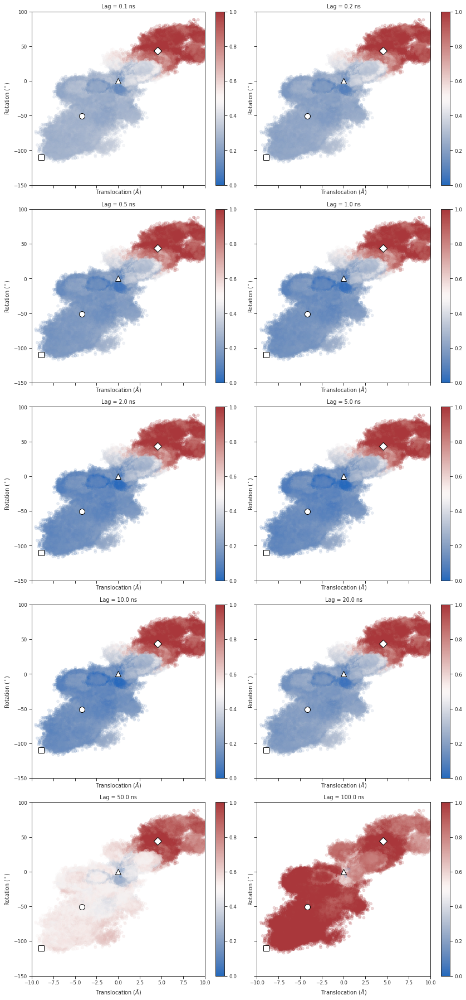

In [159]:
f, axs = plt.subplots(5, 2, figsize=(12, 25), sharex=True, sharey=True)
for lag, q, ax in zip(lags[:10], q_downup[:10], axs.flatten()):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[::5].T, c=q_arr[::5], cmap="vlag", alpha=0.2)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    util.format_cvs(ax)
f.tight_layout()
f.savefig("../../fig/committors/q_feat3_anton_half_activation_alllags_ds.png", dpi=400)

## Rates 

In [119]:
# rate calculations with different choice of reaction coordinate
rates_q = []  # reaction coordinate as forward committor
rates_qb = []  # 1 - backward committor
rates_Ac = []  # 1_{A^c}
in_ac = np.ones(len(cv_arr))
in_ac[up_ids] = 0
in_ac = np.split(in_ac, traj_inds)

rates_B = []  # 1_B
in_B = np.zeros(len(cv_arr))
in_B[upplus_ids] = 1
in_B = np.split(in_B, traj_inds)

rates_da_db = []  # d_A / (d_A + d_B)
dist_ratio = np.split(np.squeeze(d_up_arr / (d_up_arr + d_upp_arr)), traj_inds)

rates_da_ge_db = []  # 1_{d_A > d_B}
da_ge_db = np.split(np.squeeze(d_up_arr > d_upp_arr), traj_inds)

for (lag, q, qb, com) in zip(lags, q_downup, qb_downup, weights):
    print(f"Calculating rates for lag {lag}")
    # clip committors
    q = [committor.clip(min=0, max=1) for committor in q]
    qb = [committor.clip(min=0, max=1) for committor in qb]
    rates_q.append(extq.tpt.rate(q, qb, com, in_domain, q, lag))
    qb_rxn_coord = [(1 - committor) for committor in qb]
    rates_qb.append(extq.tpt.rate(q, qb, com, in_domain, qb_rxn_coord, lag))
    rates_Ac.append(extq.tpt.rate(q, qb, com, in_domain, in_ac, lag))
    rates_B.append(extq.tpt.rate(q, qb, com, in_domain, in_B, lag))
    rates_da_db.append(extq.tpt.rate(q, qb, com, in_domain, dist_ratio, lag))
    rates_da_ge_db.append(extq.tpt.rate(q, qb, com, in_domain, da_ge_db, lag))

Calculating rates for lag 1
Calculating rates for lag 2
Calculating rates for lag 5
Calculating rates for lag 10
Calculating rates for lag 20
Calculating rates for lag 50
Calculating rates for lag 100
Calculating rates for lag 200
Calculating rates for lag 500
Calculating rates for lag 1000
Calculating rates for lag 2000


In [120]:
all_rates = np.stack(
    (rates_q, rates_qb, rates_Ac, rates_B, rates_da_db, rates_da_ge_db)
)

In [121]:
all_rates.shape

(6, 11)

In [122]:
np.save("../../data/feat3_dist_anton/half/rates_all.npy", all_rates)

In [119]:
all_rates = np.load("../../data/feat3_dist_anton/50/rates_all.npy")

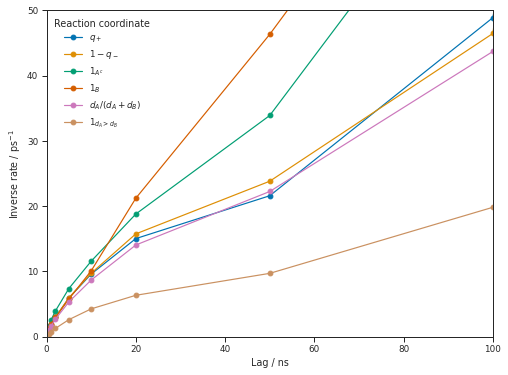

In [125]:
f = plt.figure(figsize=(8, 6))
ax = f.add_subplot(111)
lag_times = np.asarray(lags[:11]) * 0.1
for r in all_rates:
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax.plot(lag_times, 1 / r * 0.0001, "-o")
ax.set(
    xlabel="Lag / ns", ylabel="Inverse rate / ps$^{-1}$", xlim=[0, 100], ylim=[0, 50]
)
# ax.set_xscale('log')
# ax.set_yscale('log')
ax.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)
# plt.savefig('../../fig/rates/feat3_antonhalf_activation', dpi=300)

In [126]:
all_rates_all = np.load("../../data/feat3_dist_anton/100/rates_all.npy")

In [128]:
all_rates_all.shape

(6, 14)

In [163]:
sns.set_context("notebook")

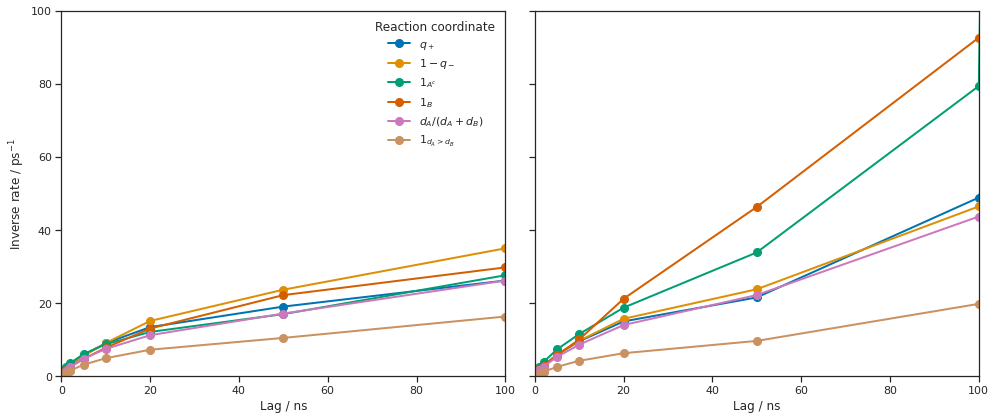

In [164]:
f, (ax0, ax1) = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)
lag_times = np.asarray(lags[:11]) * 0.1
for r1, r2 in zip(all_rates, all_rates_all[:, :11]):
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax0.plot(lag_times, 1 / r2 * 0.0001, "-o", lw=2, ms=8)
    ax1.plot(lag_times, 1 / r1 * 0.0001, "-o", lw=2, ms=8)

ax0.set(
    xlabel="Lag / ns",
    ylabel="Inverse rate / ps$^{-1}$",
)
ax1.set(xlabel="Lag / ns")
# ax0.set_xscale('log')
# ax0.set_yscale('log')
ax0.set(xlim=[0, 100], ylim=[0, 100])
ax0.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper right",
)
f.tight_layout()
plt.savefig("../../fig/rates/feat3_dist_comparison", dpi=400)

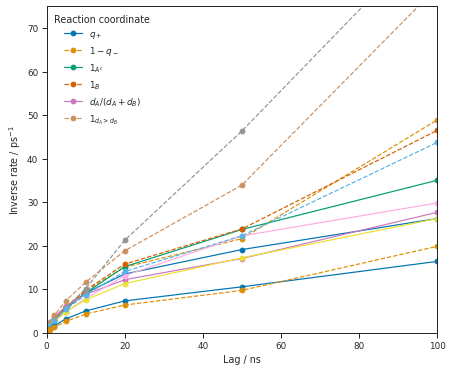

In [149]:
f, ax = plt.subplots(figsize=(7, 6))
lag_times = np.asarray(lags[:11]) * 0.1
for r1, r2 in zip(all_rates, all_rates_all[:, :11]):
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax.plot(lag_times, 1 / r2 * 0.0001, "-o")
    ax.plot(lag_times, 1 / r1 * 0.0001, "--o")

ax.set(
    xlabel="Lag / ns",
    ylabel="Inverse rate / ps$^{-1}$",
)
# ax.set_xscale('log')
# ax.set_yscale('log')
ax.set(xlim=[0, 100], ylim=[0, 75])
ax.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)

# Paper figure 

In [4]:
with np.load("../../data/raw_feat/cv_dist_spin.npz", allow_pickle=True) as f:
    cv_arr = f["arr_0"]

In [5]:
livac_trajs = np.load("../../data/sb_ind100_TICA/livac_trajs.npy", allow_pickle=True)
livac_arr = np.concatenate(livac_trajs)
models_km100 = np.load("../../data/sb_ind100_TICA/models.npy", allow_pickle=True)

In [6]:
orig_traj_lens = [len(traj) for traj in livac_trajs]
orig_traj_inds = []
subtot = 0
for length in orig_traj_lens[:-1]:
    subtot += length
    orig_traj_inds.append(subtot)

In [7]:
with np.load("../../data/raw_feat/ri126_dist.npz", allow_pickle=True) as f:
    ri_trajs = f["arr_0"]
len(ri_trajs)

1295

In [8]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [9]:
with np.load("../../data/raw_feat/feat2_raw.npz", allow_pickle=True) as f:
    sb_data = f["arr_0"]

In [10]:
print(len(sb_data))
print(sb_data[0].shape)

1295
(3000, 60)


In [13]:
cv_trajs = np.split(cv_arr, orig_traj_inds)
livac_trajs = list(livac_trajs)
ri_trajs = list(ri_trajs)
sb_data = list(sb_data)
for idx in sorted(remove, reverse=True):
    del livac_trajs[idx]
    del ri_trajs[idx]
    del sb_data[idx]
    del cv_trajs[idx]
livac_trajs = livac_trajs[1000:]
ri_trajs = ri_trajs[1000:]
sb_data = sb_data[1000:]
cv_trajs = cv_trajs[1000:]
print(len(livac_trajs), len(ri_trajs), len(sb_data), len(cv_trajs))

livac_arr = np.concatenate(livac_trajs)
ri_arr = np.concatenate(ri_trajs)
sb_data_arr = np.concatenate(sb_data)
cv_arr = np.concatenate(cv_trajs)
print(livac_arr.shape, ri_arr.shape, sb_data_arr.shape, cv_arr.shape)

237 237 237 237
(3000000, 5) (3000000, 5) (3000000, 60) (3000000, 2)


In [14]:
# load committors
q = np.load("../../data/feat3_dist_anton/100/q_downup.npy", allow_pickle=True)[7]
print(q.shape)

(237,)


In [15]:
# useful salt bridges for up to up+ transition
# R229-D129, R232-D129, R229-D186, R232-D186
sb_ids_uu = [48, 54, 53, 59]

In [16]:
from itertools import combinations

In [17]:
feat2_models = np.load("../../data/models_feat2.npy")

In [18]:
plt.style.use("seaborn-ticks")
sns.set_palette("colorblind")

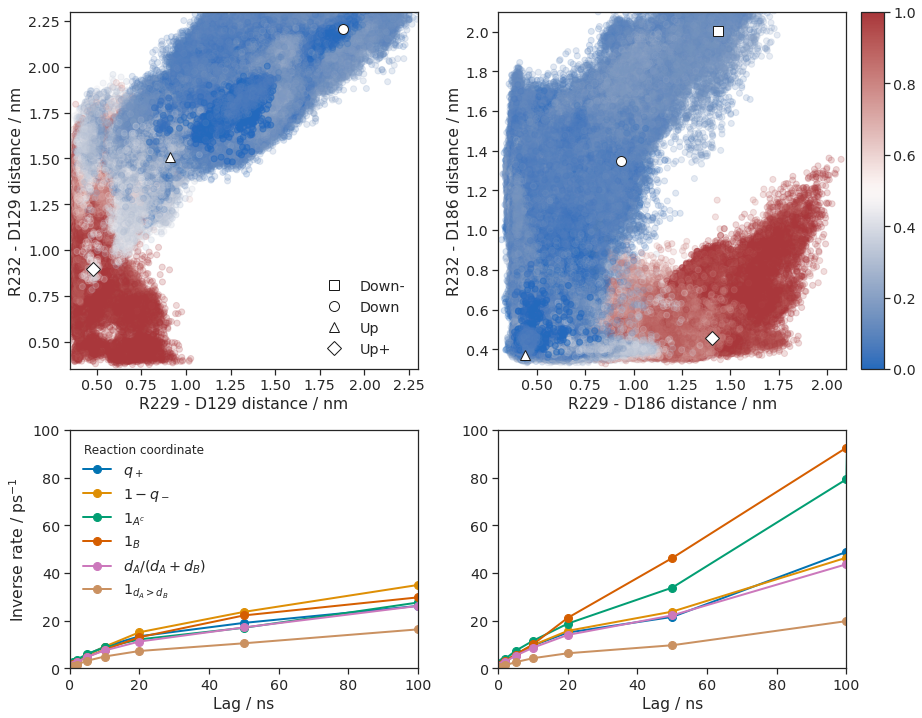

In [209]:
plt.rcParams.update({"font.size": 27})
sns.set_style("ticks")

f = plt.figure(figsize=(6.514 * 3 * 0.65, 5.06 * 3 * 0.65), constrained_layout=True)
spec = f.add_gridspec(ncols=2, nrows=2, height_ratios=[3, 2])
ax0 = f.add_subplot(spec[1, 0])
ax1 = f.add_subplot(spec[1, 1], sharex=ax0, sharey=ax0)
ax2 = f.add_subplot(spec[0, 0])
ax3 = f.add_subplot(spec[0, 1])

# plot rates
lag_times = np.asarray(lags[:11]) * 0.1
for r1, r2 in zip(all_rates, all_rates_all[:, :11]):
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax0.plot(lag_times, 1 / r2 * 0.0001, "-o", lw=2, ms=8)
    ax1.plot(lag_times, 1 / r1 * 0.0001, "-o", lw=2, ms=8)

ax0.set(
    xlabel="Lag / ns",
    ylabel="Inverse rate / ps$^{-1}$",
)
ax1.set(xlabel="Lag / ns")
# ax0.set_xscale('log')
# ax0.set_yscale('log')
ax0.set(xlim=[0, 100], ylim=[0, 100])
ax0.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)

# plot committors
q_arr = np.concatenate(q).clip(min=0, max=1)
ax2.scatter(
    sb_data_arr[::5, 48], sb_data_arr[::5, 54], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax2.set(
    xlabel=f"{sb_labels[18]} distance / nm",
    ylabel=f"{sb_labels[24]} distance / nm",
    xlim=[0.35, 2.3],
    ylim=[0.35, 2.3],
)

h = ax3.scatter(
    sb_data_arr[::5, 53], sb_data_arr[::5, 59], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax3.set(
    xlabel=f"{sb_labels[23]} distance / nm",
    ylabel=f"{sb_labels[29]} distance / nm",
    xlim=[0.3, 2.1],
    ylim=[0.3, 2.1],
)
cbar = plt.colorbar(h, ax=ax3)
cbar.solids.set(alpha=1)
util.plot_models(ax2, feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(ax3, feat2_models[:, 53:60:6])  # 53 and 59
ax2.legend(["Down-", "Down", "Up", "Up+"], loc="lower right")

# f.tight_layout()
# plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
plt.savefig("../../fig/proposal_figure_rates_committors_0", dpi=400)

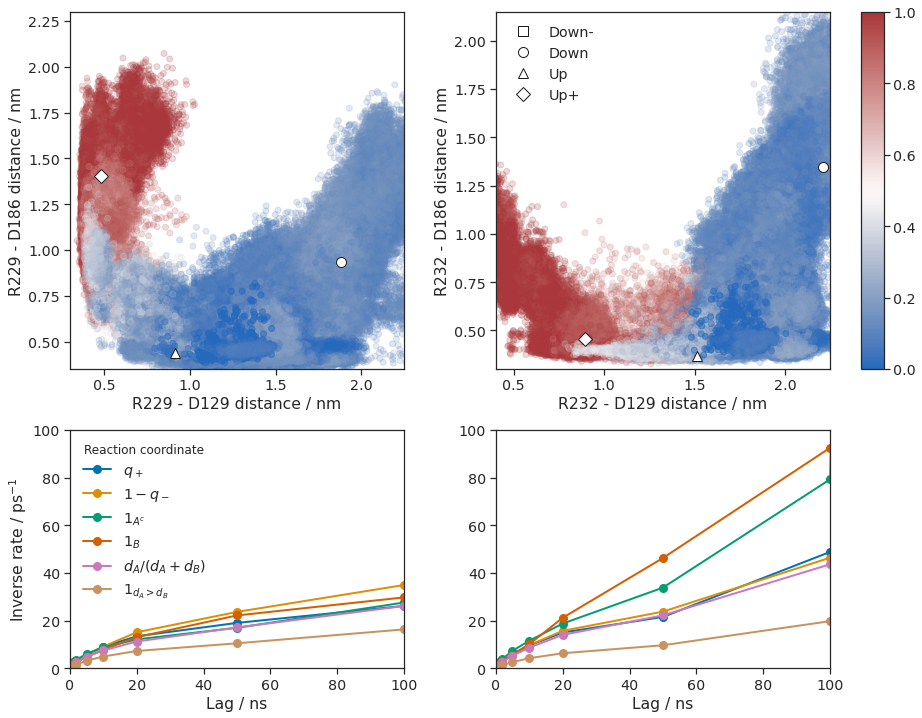

In [212]:
plt.rcParams.update({"font.size": 27})
sns.set_style("ticks")

f = plt.figure(figsize=(6.514 * 3 * 0.65, 5.06 * 3 * 0.65), constrained_layout=True)

spec = f.add_gridspec(ncols=2, nrows=2, height_ratios=[3, 2])
ax0 = f.add_subplot(spec[1, 0])
ax1 = f.add_subplot(spec[1, 1], sharex=ax0, sharey=ax0)
ax2 = f.add_subplot(spec[0, 0])
ax3 = f.add_subplot(spec[0, 1])

# plot rates
lag_times = np.asarray(lags[:11]) * 0.1
for r1, r2 in zip(all_rates, all_rates_all[:, :11]):
    # units are 0.1 ns, inverse rates in 10 ns^-1
    ax0.plot(lag_times, 1 / r2 * 0.0001, "-o", lw=2, ms=8)
    ax1.plot(lag_times, 1 / r1 * 0.0001, "-o", lw=2, ms=8)

ax0.set(
    xlabel="Lag / ns",
    ylabel="Inverse rate / ps$^{-1}$",
)
ax1.set(xlabel="Lag / ns")
# ax0.set_xscale('log')
# ax0.set_yscale('log')
ax0.set(xlim=[0, 100], ylim=[0, 100])
ax0.legend(
    [
        "$q_+$",
        "$1 - q_-$",
        "$1_{A^c}$",
        "$1_B$",
        "$d_A / (d_A + d_B)$",
        "$1_{d_A > d_B}$",
    ],
    title="Reaction coordinate",
    loc="upper left",
)

# plot committors
q_arr = np.concatenate(q).clip(min=0, max=1)
ax2.scatter(
    sb_data_arr[::5, 48], sb_data_arr[::5, 53], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax2.set(
    xlabel=f"{sb_labels[18]} distance / nm",
    ylabel=f"{sb_labels[23]} distance / nm",
    xlim=[0.3, 2.25],
    ylim=[0.35, 2.3],
)

h = ax3.scatter(
    sb_data_arr[::5, 54], sb_data_arr[::5, 59], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax3.set(
    xlabel=f"{sb_labels[24]} distance / nm",
    ylabel=f"{sb_labels[29]} distance / nm",
    xlim=[0.4, 2.25],
    ylim=[0.3, 2.15],
)
cbar = plt.colorbar(h, ax=ax3)
cbar.solids.set(alpha=1)
util.plot_models(ax2, feat2_models[:, 48:54:5])  # 48 and 53
util.plot_models(ax3, feat2_models[:, 54:60:5])  # 54 and 59
ax3.legend(["Down-", "Down", "Up", "Up+"], loc="upper left")

# f.tight_layout()
plt.savefig("../../fig/proposal_figure_rates_committors_1", dpi=400)

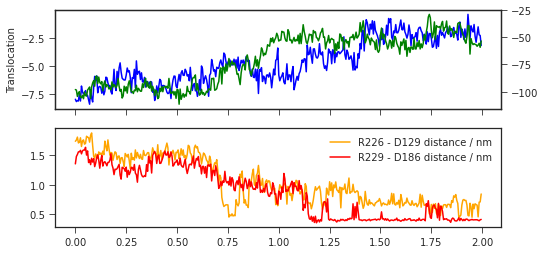

In [42]:
end = 20000
skip = 50
t = np.arange(0, end / skip) * 0.0001 * skip  # units of us
# plot salt bridge distance
f, (ax0, ax1) = plt.subplots(2, 1, figsize=(8, 4), sharex=True)
ax0.plot(t, cv_trajs[179][:end:skip, 0], "b", label="Translocation")
ax0.set_ylabel("Translocation")
ax2 = ax0.twinx()
ax2.plot(t, cv_trajs[179][:end:skip, 1], "green", label="Rotation")

# R2-D129
ax1.plot(
    t, sb_data[179][:end:skip, 42], "orange", label=f"{sb_labels[12]} distance / nm"
)
# R3-D186
ax1.plot(t, sb_data[179][:end:skip, 53], "red", label=f"{sb_labels[23]} distance / nm")
ax1.legend()

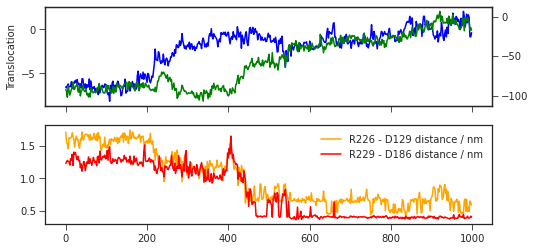

In [51]:
end = 10000
skip = 20
traj_id = 171
t = np.arange(0, end / skip) * 0.1 * skip  # units of us
# plot salt bridge distance
f, (ax0, ax1) = plt.subplots(2, 1, figsize=(8, 4), sharex=True)
ax0.plot(t, cv_trajs[traj_id][:end:skip, 0], "b", label="Translocation")
ax0.set_ylabel("Translocation")
ax2 = ax0.twinx()
ax2.plot(t, cv_trajs[traj_id][:end:skip, 1], "green", label="Rotation")

# R2-D129
ax1.plot(
    t, sb_data[traj_id][:end:skip, 42], "orange", label=f"{sb_labels[12]} distance / nm"
)
# R3-D186
ax1.plot(
    t, sb_data[traj_id][:end:skip, 53], "red", label=f"{sb_labels[23]} distance / nm"
)
ax1.legend()

[Text(0.5, 0, 'Time / ns'), Text(0, 0.5, 'Distance / nm'), (0.0, 1000.0)]

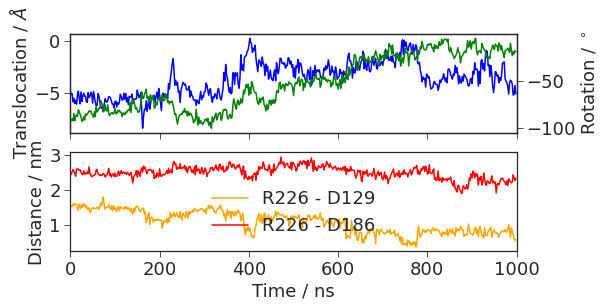

In [69]:
end = 10000
skip = 20
traj_id = 154
t = np.arange(0, end / skip) * 0.1 * skip  # units of us
# plot salt bridge distance
f, (ax0, ax1) = plt.subplots(2, 1, figsize=(8, 4), sharex=True)
ax0.plot(t, cv_trajs[traj_id][:end:skip, 0], "b", label="Translocation")
ax0.set_ylabel("Translocation / $\AA$")
ax2 = ax0.twinx()
ax2.plot(t, cv_trajs[traj_id][:end:skip, 1], "green", label="Rotation")
ax2.set_ylabel("Rotation / $^\circ$")

# R2-D129
ax1.plot(t, sb_data[traj_id][:end:skip, 42], "orange", label=f"{sb_labels[12]}")
# R2-D186
ax1.plot(t, sb_data[traj_id][:end:skip, 57], "red", label=f"{sb_labels[17]}")
ax1.legend()
ax1.set(xlabel="Time / ns", ylabel="Distance / nm", xlim=[0, 1000])

In [65]:
from matplotlib import ticker

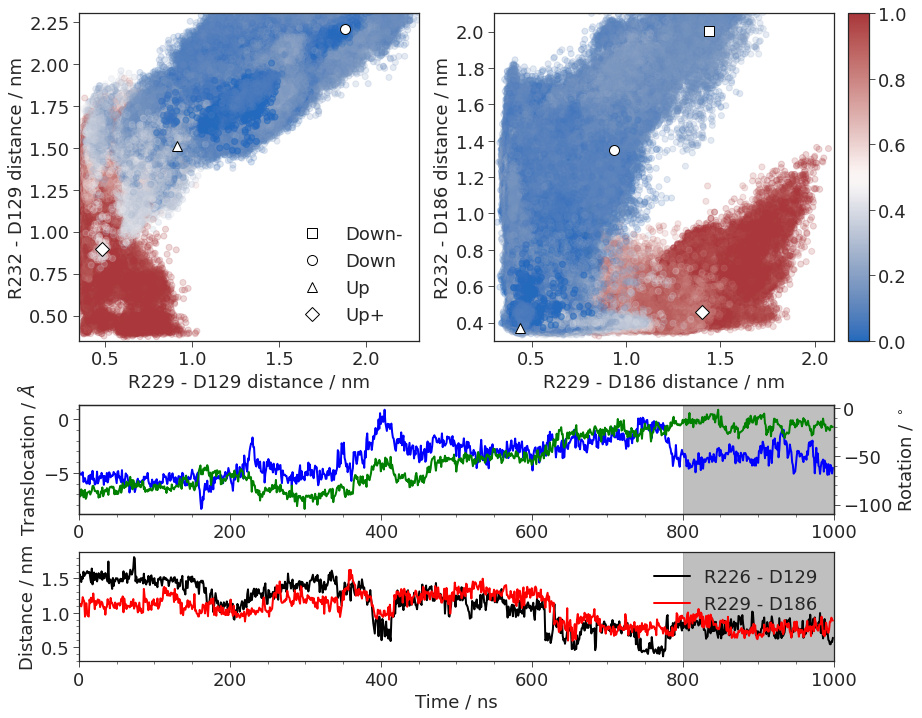

In [77]:
plt.rcParams.update({"font.size": 18})
sns.set_style("ticks")

f = plt.figure(figsize=(6.514 * 3 * 0.65, 5.06 * 3 * 0.65), constrained_layout=True)

spec = f.add_gridspec(ncols=2, nrows=3, height_ratios=[3, 1, 1])
ax0 = f.add_subplot(spec[1, :])
ax1 = f.add_subplot(spec[-1, :], sharex=ax0)
ax2 = f.add_subplot(spec[0, 0])
ax3 = f.add_subplot(spec[0, 1])

end = 10000
skip = 10
traj_id = 154
t = np.arange(0, end / skip) * 0.1 * skip  # units of us
# plot salt bridge distance
ax0.plot(t, cv_trajs[traj_id][:end:skip, 0], "b", label="Translocation", lw=2)
ax0.set_ylabel("Translocation / $\AA$")
ax0.axvspan(800, 1000, alpha=0.5, color="grey")
ax0.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax0.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax0_r = ax0.twinx()
ax0_r.plot(t, cv_trajs[traj_id][:end:skip, 1], "g", label="Rotation", lw=2)
ax0_r.set_ylabel("Rotation / $^\circ$")
ax0_r.yaxis.set_minor_locator(ticker.AutoMinorLocator())

# R2-D129
ax1.plot(t, sb_data[traj_id][:end:skip, 42], "k", label=f"{sb_labels[12]}", lw=2)
# R3-D186
ax1.plot(t, sb_data[traj_id][:end:skip, 53], "r", label=f"{sb_labels[23]}", lw=2)
ax1.legend(loc="upper right")
ax1.set(xlabel="Time / ns", ylabel="Distance / nm", xlim=[0, 1000])
ax1.axvspan(800, 1000, alpha=0.5, color="grey")
ax1.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax1.yaxis.set_minor_locator(ticker.AutoMinorLocator())


# plot committors
q_arr = np.concatenate(q).clip(min=0, max=1)
ax2.scatter(
    sb_data_arr[::5, 48], sb_data_arr[::5, 54], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax2.set(
    xlabel=f"{sb_labels[18]} distance / nm",
    ylabel=f"{sb_labels[24]} distance / nm",
    xlim=[0.35, 2.3],
    ylim=[0.35, 2.3],
)

h = ax3.scatter(
    sb_data_arr[::5, 53], sb_data_arr[::5, 59], c=q_arr[::5], cmap="vlag", alpha=0.2
)
ax3.set(
    xlabel=f"{sb_labels[23]} distance / nm",
    ylabel=f"{sb_labels[29]} distance / nm",
    xlim=[0.3, 2.1],
    ylim=[0.3, 2.1],
)
cbar = plt.colorbar(h, ax=ax3)
cbar.solids.set(alpha=1)
util.plot_models(ax2, feat2_models[:, 48:55:6])  # indexes 48 and 54
util.plot_models(ax3, feat2_models[:, 53:60:6])  # 53 and 59
ax2.legend(["Down-", "Down", "Up", "Up+"], loc="lower right")

# f.tight_layout()
plt.savefig("../../fig/proposal_figure_committors_sb_timeseries_2", dpi=400)